In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pycountry_convert as pc
from sklearn import preprocessing
from sklearn.cluster import KMeans
sns.set(rc={'figure.figsize':(18, 3)})

In [2]:
pd.set_option('display.float_format', lambda x: '%.5f' % x)
# pd.set_option('display.float_format', lambda x: x)
# pd.reset_option('^display.', silent=True)

## Using preprocessed datasets

In [3]:
crops_clean = pd.read_csv('datasets_cleaned/crops_cleaned.csv')
all_countries = pd.read_csv('datasets_cleaned/all_countries.csv')
crop_groups = pd.read_csv('datasets_cleaned/crop_groups.csv')
prices_clean = pd.read_csv('datasets_cleaned/producer_prices_cleaned.csv')
caffeine_prices_clean = pd.read_csv('datasets_cleaned/caffeine_prices_clean.csv')
rainfall = pd.read_csv('datasets_cleaned/rainfall_clean.csv')
temperatures = pd.read_csv('datasets_cleaned/temperatures_clean.csv')
gdp_data = pd.read_csv('datasets_cleaned/gdp_data.csv')

# merged data reads here!!!
yield_melted = pd.read_csv('datasets_cleaned/yield_melted.csv')
prod_melted = pd.read_csv('datasets_cleaned/prod_melted.csv')
areaHarv_melted = pd.read_csv('datasets_cleaned/areaHarv_melted.csv')
prices_melted = pd.read_csv('datasets_cleaned/prices_melted.csv')
climate_melted = pd.read_csv('datasets_cleaned/climate_melted.csv')
country_gdp_melted = pd.read_csv('datasets_cleaned/country_gdp_melted.csv')

# Data Modeling

## Clustering

In [4]:
rawMeltedYield = yield_melted.groupby(['Year', 'Area'])['Yield'].mean().reset_index()
rawMeltedProduction = prod_melted.groupby(['Year', 'Area'])['Production'].sum().reset_index()

In [5]:
rawMeltedProduction

,Year,Area,Production
0,1961,Afghanistan,10113549.00000
1,1961,Africa,391312625.00000
2,1961,Albania,1457890.00000
3,1961,Algeria,8995374.00000
4,1961,American Samoa,25852.00000
...,...,...,...
15017,2018,World,19413566384.00000
15018,2018,Yemen,4986815.00000
15019,2018,Yugoslav SFR,0.00000
15020,2018,Zambia,19756945.00000


### *...some messing around...*

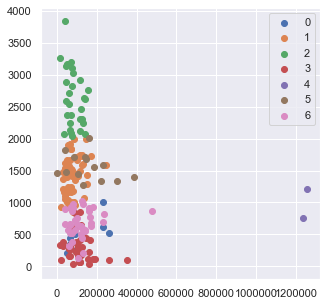

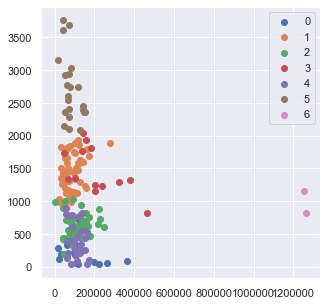

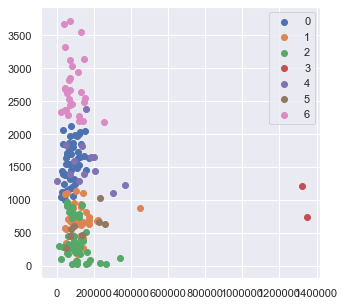

In [6]:
years = [2014, 2015, 2016]
for year in years:
    yield_temp = rawMeltedYield[rawMeltedYield['Year'] == year]
    climate_temp = climate_melted[climate_melted['Year'] == year]
    yield_climate_temp = pd.merge(yield_temp, climate_temp, on=['Year', 'Area'], how ='inner')
    X = yield_climate_temp[['Yield', 'Rainfall - (MM)', 'Temperature - (Celsius)']].copy()
    
    scaler = preprocessing.MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    
    model = KMeans(7, verbose=0)
    label = model.fit_predict(X_scaled)
    X.loc[:,'label'] = pd.Series(label)
    
    #Getting unique labels
    u_labels = np.unique(label)

    #plotting the results:
    plt.figure(figsize=(5,5))
    for i in u_labels:
        plt.scatter(X.iloc[label == i, 0] , X.iloc[label == i, 1] , label = i)
    plt.legend()
    plt.show()

### Merging Yield and climate data ...

In [7]:
# melted yield data without 'Items'
yield_toMerge = yield_melted.groupby(['Year', 'Area'])['Yield'].mean().reset_index()

# merging country yield and climate data
yield_and_climate = pd.merge(yield_toMerge, climate_melted, on=['Year', 'Area'], how='inner')

yield_and_climate

,Year,Area,Yield,Rainfall - (MM),Temperature - (Celsius)
0,1991,Afghanistan,55789.14583,435.44990,12.89449
1,1991,Albania,72175.01389,917.86880,11.03765
2,1991,Algeria,39498.31944,88.13276,22.51346
3,1991,Angola,40565.00000,1017.98660,21.71688
4,1991,Antigua and Barbuda,49817.48485,2151.03100,26.08025
...,...,...,...,...,...
4909,2016,Venezuela (Bolivarian Republic of),127677.08571,1844.70330,26.47820
4910,2016,Viet Nam,98377.59615,1988.86180,25.07316
4911,2016,Yemen,62133.75758,171.48137,24.22120
4912,2016,Zambia,85609.76923,803.47810,22.73705


### Question: *What can be made of clusters seen from annual total production vs GDP over time?*

### Merging production and GDP data ...

In [8]:
# melted production data without 'Items'
prod_toMerge = prod_melted.groupby(['Year', 'Area'])['Production'].sum().reset_index()

# only countries
prod_toMerge = prod_toMerge[prod_toMerge['Area'].isin(all_countries['0'])] 

# merging product and gdp data
prod_and_gdp = pd.merge(prod_toMerge, country_gdp_melted, on=['Year', 'Area'], how='inner')

prod_and_gdp

,Year,Area,Production,Gross Domestic Product
0,1990,Afghanistan,8827277.00000,3621.60001
1,1990,Albania,3609949.00000,2145.77452
2,1990,Algeria,10952838.00000,61751.37596
3,1990,Angola,6708679.00000,13661.85235
4,1990,Antigua and Barbuda,22864.00000,459.47037
...,...,...,...,...
5969,2018,Viet Nam,253898848.00000,244901.10410
5970,2018,Yemen,4986815.00000,26671.57950
5971,2018,Yugoslav SFR,0.00000,1563047.95919
5972,2018,Zambia,19756945.00000,27282.85451


## Total Production vs GDP, finding clusters of countries for each year

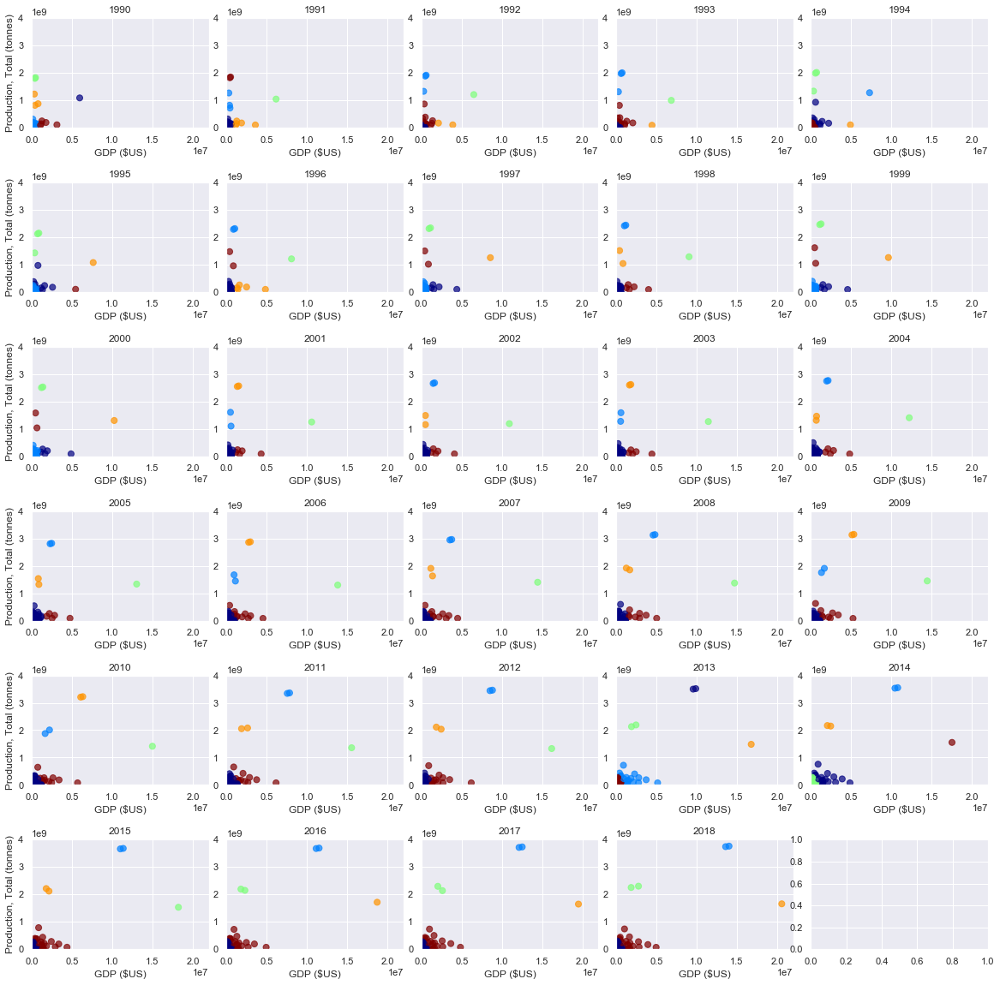

In [9]:
fig, axes = plt.subplots(6,5, figsize=(20, 20), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .5, wspace=.1)

grid_combos = []
for i in range(6):
    for j in range(5):
        grid_combos.append((i, j))
        
# from the years ?
years = [year for year in range(1990, 2019)]
        
for i, year in enumerate(years):
    # taking country total production and gdp for this year
    year_filter = (prod_and_gdp['Year'] == year)
    prod_and_gdp2 = prod_and_gdp.loc[year_filter, ['Year', 'Area', 'Production', 'Gross Domestic Product']]

    # scaling the numerical values
    scaler = preprocessing.MinMaxScaler() # min-max normalizer
    X = prod_and_gdp2[['Production', 'Gross Domestic Product']] # numeric values only
    X_scaled = X.copy()
    X_scaled[['Production', 'Gross Domestic Product']] = scaler.fit_transform(X) # scaling numerics
    
    # kmeans clustering
    model = KMeans(5, verbose=0) # fitting for 5 clusters
    model.fit(X_scaled)
    X_scaled['kmeans'] = model.labels_
    kmeans_labels = pd.Series(model.labels_)
    v1 = X['Gross Domestic Product']
    v2 = X['Production']
    
    # drawing scatterplot for this year
    row, col = grid_combos[i]
    axes[row, col].scatter(v1, v2, c = kmeans_labels, s=50, cmap='jet',alpha=0.7)
    axes[row, col].set_title(year)
    axes[row, col].set(xlim=(0, 2.2e7))
    axes[row, col].set(ylim=(0, 4.0e9))
    axes[row, col].set_xlabel('GDP ($US)')
    
    if (col % 5 == 0):
        axes[row, col].set_ylabel('Production, Total (tonnes)')
    else:
        axes[row, col].set_ylabel('')


In [10]:
# studying the countries of the different groups in 2018
for g in range(0,5):  
    print(f'Group {g}:\n')
    print(prod_and_gdp2.loc[(X_scaled['kmeans'] == g), 'Area'])
    print()

Group 0:

5768                           Afghanistan
5769                               Albania
5770                               Algeria
5771                                Angola
5772                   Antigua and Barbuda
                       ...                
5968    Venezuela (Bolivarian Republic of)
5969                              Viet Nam
5970                                 Yemen
5972                                Zambia
5973                              Zimbabwe
Name: Area, Length: 180, dtype: object

Group 1:

5805              China
5808    China, mainland
Name: Area, dtype: object

Group 2:

5791    Brazil
5854     India
Name: Area, dtype: object

Group 3:

5964    United States of America
Name: Area, dtype: object

Group 4:

5773                                            Argentina
5775                                            Australia
5800                                               Canada
5818                                       Czechoslovakia
5834         

## Average yield vs Average temperature, finding clusters of countries for each year

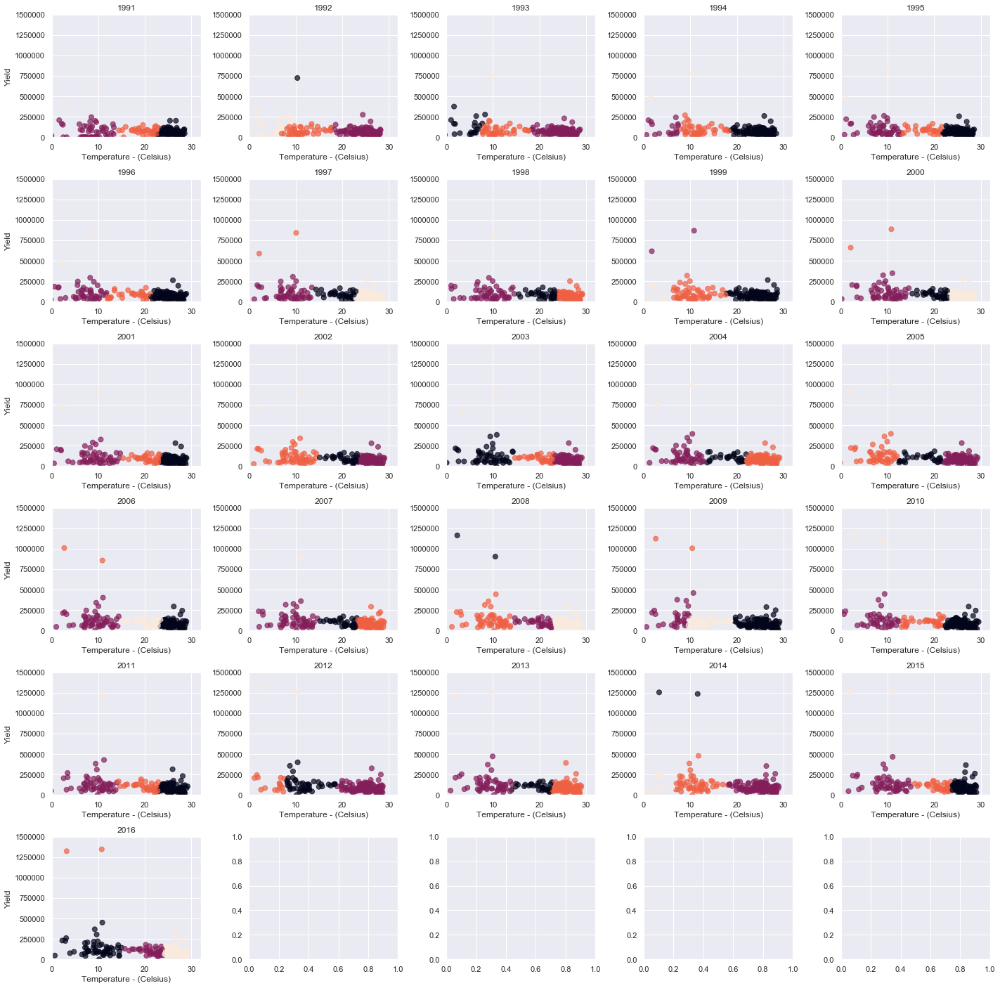

In [11]:
fig, axes = plt.subplots(6,5, figsize=(20, 20), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .6, wspace=.1)
fig.tight_layout(pad=3.0)

grid_combos = []
for i in range(6):
    for j in range(5):
        grid_combos.append((i, j))
        
# from the years 1991 to 2016
years = [year for year in range(1991, 2017)]
        
for i, year in enumerate(years):
    # taking country yield and temperature for this year
    year_filter = (yield_and_climate['Year'] == year)
    yield_and_temperature = yield_and_climate.loc[year_filter, ['Year', 'Area', 'Yield', 'Temperature - (Celsius)']]
    
    # scaling the numerical values
    scaler = preprocessing.MinMaxScaler() # min-max normalizer
    X = yield_and_temperature[['Yield', 'Temperature - (Celsius)']] # numeric values only
    X_scaled = X.copy()
    X_scaled[['Yield', 'Temperature - (Celsius)']] = scaler.fit_transform(X) # scaling numerics
    
    # kmeans clustering
    model = KMeans(4, verbose=0) # fitting for 5 clusters
    model.fit(X_scaled)
    X_scaled['kmeans'] = model.labels_
    kmeans_labels = pd.Series(model.labels_)
    v1 = X['Temperature - (Celsius)']
    v2 = X['Yield']

    # drawing scatterplot for this year
    row, col = grid_combos[i]
    axes[row, col].scatter(v1, v2, c=kmeans_labels, s=50,cmap='rocket',alpha=0.7)
    axes[row, col].set_title(year)
    axes[row, col].set(xlim=(0, 32))
    axes[row, col].set(ylim=(0, 1.5e6))
    axes[row, col].set_xlabel(v1.name)
    
    if (col % 5 == 0):
        axes[row, col].set_ylabel(v2.name)
    else:
        axes[row, col].set_ylabel('')


In [12]:
# studying the clusters of 2016...
for g in range(0,5):  
    print(f'Group {g}:\n')
    print(yield_and_temperature.loc[(X_scaled['kmeans'] == g), 'Area'])
    print()

Group 0:

4725                                          Afghanistan
4726                                              Albania
4730                                            Argentina
4731                                              Armenia
4733                                              Austria
4734                                           Azerbaijan
4739                                              Belarus
4740                                              Belgium
4743                                               Bhutan
4745                               Bosnia and Herzegovina
4749                                             Bulgaria
4755                                               Canada
4758                                                Chile
4759                                                China
4764                                              Croatia
4767                                              Czechia
4770                                              Denmark
4779

## Average yield vs Total rainfall, finding clusters of countries for each year

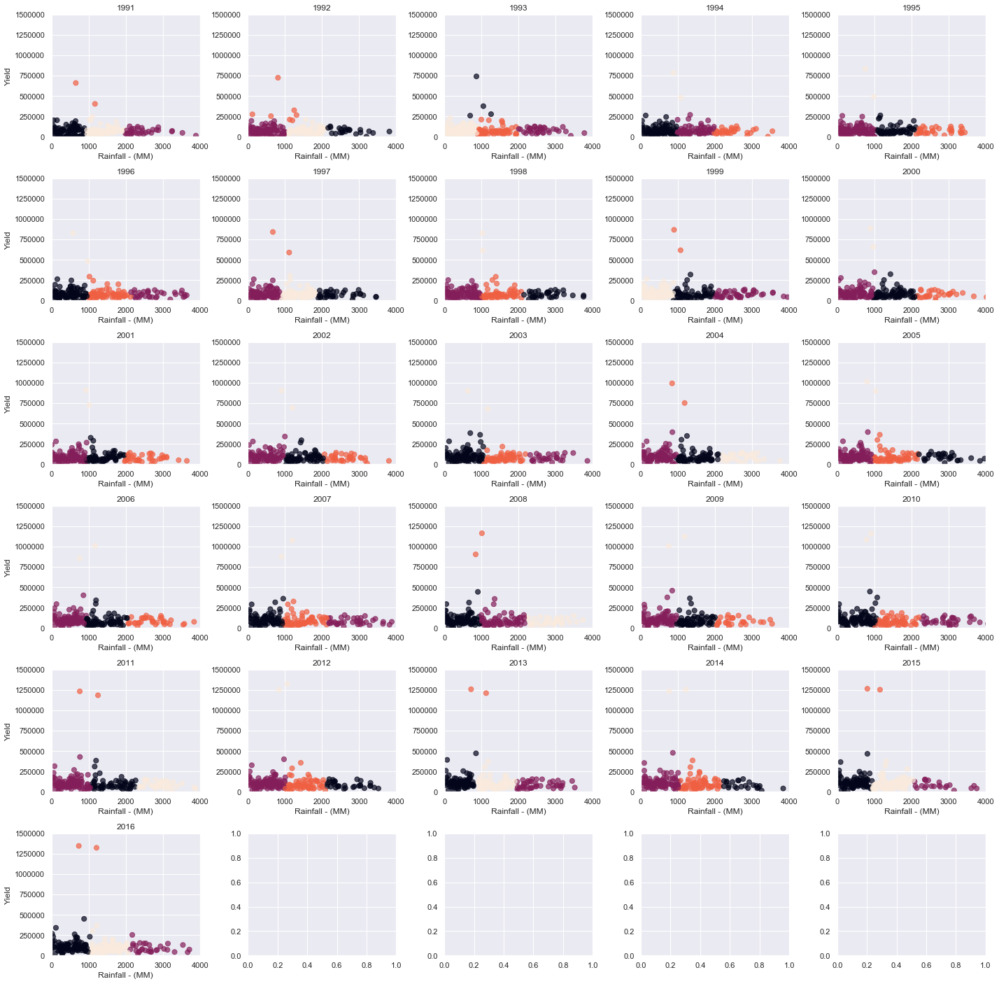

In [13]:
fig, axes = plt.subplots(6,5, figsize=(20, 20), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .5, wspace=.1)
fig.tight_layout(pad=3.0)

grid_combos = []
for i in range(6):
    for j in range(5):
        grid_combos.append((i, j))
        
# from the years 1991 to 2016
years = [year for year in range(1991, 2017)]
        
for i, year in enumerate(years):
    # taking country yield and rainfall for this year
    year_filter = (yield_and_climate['Year'] == year)
    yield_and_rainfall = yield_and_climate.loc[year_filter, ['Year', 'Area', 'Yield', 'Rainfall - (MM)']]

    # scaling the numerical values
    scaler = preprocessing.MinMaxScaler() # min-max normalizer
    X = yield_and_rainfall[['Yield', 'Rainfall - (MM)']] # numeric values only
    X_scaled = X.copy()
    X_scaled[['Yield', 'Rainfall - (MM)']] = scaler.fit_transform(X) # scaling numerics
    
    # kmeans clustering
    model = KMeans(4, verbose=0) # fitting for 5 clusters
    model.fit(X_scaled)
    X_scaled['kmeans'] = model.labels_
    kmeans_labels = pd.Series(model.labels_)
    v1 = X['Rainfall - (MM)']
    v2 = X['Yield']

    # drawing scatterplot for this year
    row, col = grid_combos[i]
    axes[row, col].scatter(v1, v2, c=kmeans_labels, s=50,cmap='rocket',alpha=0.7)
    axes[row, col].set_title(year)
    axes[row, col].set(xlim=(0, 4e3))
    axes[row, col].set(ylim=(0, 1.5e6))
    axes[row, col].set_xlabel(v1.name)
    
    if (col % 5 == 0):
        axes[row, col].set_ylabel(v2.name)
    else:
        axes[row, col].set_ylabel('')

The factors that impact crop growth are mainly rainfall and temperature. We have this data, so is it possible to train a regression model for future predictions? Let's see.

## Per Country Correlations

### Crops Overall

In [14]:
rawMeltedYield

,Year,Area,Yield
0,1961,Afghanistan,40287.91667
1,1961,Africa,45553.50993
2,1961,Albania,15242.56944
3,1961,Algeria,31470.05556
4,1961,American Samoa,19846.12000
...,...,...,...
14843,2018,World,93636.97674
14844,2018,Yemen,60869.95455
14845,2018,Yugoslav SFR,0.00000
14846,2018,Zambia,82033.07692


### Finding Correlations to see strength

In [15]:
areaHarvestedMelted = areaHarv_melted.groupby(['Year', 'Area'])['Area harvested'].sum().reset_index()
areaHarvestedMelted

,Year,Area,Area harvested
0,1961,Afghanistan,7959162.00000
1,1961,Africa,238329548.00000
2,1961,Albania,998260.00000
3,1961,Algeria,6841230.00000
4,1961,American Samoa,18425.00000
...,...,...,...
14901,2018,World,3456659059.00000
14902,2018,Yemen,1878576.00000
14903,2018,Yugoslav SFR,0.00000
14904,2018,Zambia,6094188.00000


In [16]:
coffHarvestedMelted = areaHarv_melted[areaHarv_melted['Item'].str.contains('Coffee')].groupby(['Year', 'Area'])['Area harvested'].sum().reset_index()
coffHarvestedMelted

,Year,Area,Area harvested
0,1961,Africa,2160542.00000
1,1961,Americas,7209734.00000
2,1961,Angola,350000.00000
3,1961,Asia,374177.00000
4,1961,Belize,0.00000
...,...,...,...
6491,2018,Western Asia,33975.00000
6492,2018,World,10584305.00000
6493,2018,Yemen,33975.00000
6494,2018,Zambia,7876.00000


224


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  app.launch_new_instance()
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation:

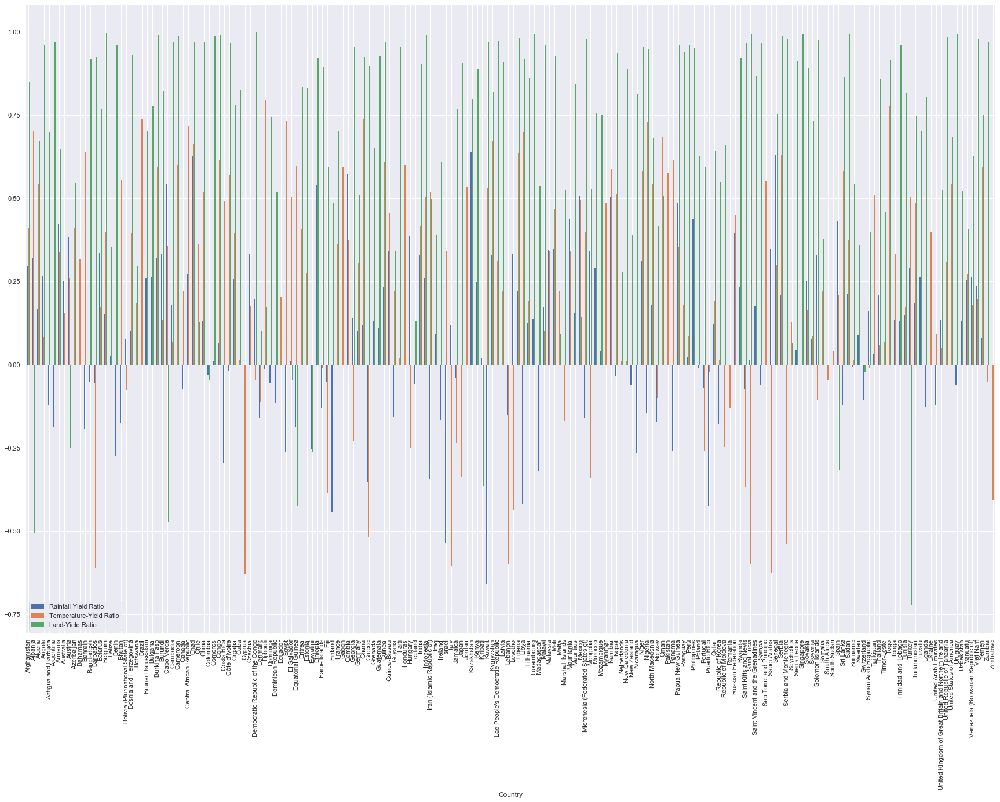

In [17]:
countriesOfInterest = all_countries['0']
print(len(countriesOfInterest))
countriesMeetingThreshold = []

# fig, ax = plt.subplots(44, 5, figsize=(200, 500))

# grid_combos = []
# for i in range(44):
#     for j in range(5):
#         grid_combos.append((i, j))

for i, country in enumerate(countriesOfInterest):
    countryyield = rawMeltedProduction[rawMeltedProduction['Area'] == country]
    countryyield['Year'] = countryyield['Year'].astype(str)
    countryclimate = climate_melted[climate_melted['Area'] == country]
    countryclimate['Year'] = countryclimate['Year'].astype(str)
    countryharvested = areaHarvestedMelted[areaHarvestedMelted['Area'] == country]
    countryharvested['Year'] = countryharvested['Year'].astype(str)
    
    countrymerged = pd.merge(countryyield, countryclimate, on=["Year", "Area"], how='inner')
    countrymerged['Year'] = countrymerged['Year'].astype(str)
    
    countrymerged = countrymerged.merge(countryharvested, on=['Year', 'Area'], how='inner')
    countrymerged.drop(columns=['index'], inplace=True, errors='ignore')
    corr = countrymerged.corr()
#     row, col = grid_combos[i]
#     try:
#         sns.heatmap(corr, ax=ax[row, col])
#     except:
#         pass
    countriesMeetingThreshold.append([country, corr.iloc[1,0], corr.iloc[2,0], corr.iloc[3,0]])    

countriesMeetingThreshold = pd.DataFrame(countriesMeetingThreshold, columns=['Country', 'Rainfall-Yield Ratio', 'Temperature-Yield Ratio', 'Land-Yield Ratio'])
countriesMeetingThreshold.dropna(inplace=True)
countriesMeetingThreshold.sort_values(by='Temperature-Yield Ratio', ascending=False)
countriesMeetingThreshold.set_index('Country', inplace=True)
countriesMeetingThreshold.plot.bar(edgecolor='none', figsize=(30,20))

In [18]:
countriesMeetingThreshold.sort_values(by=['Rainfall-Yield Ratio', 'Temperature-Yield Ratio'], ascending=False)

,Rainfall-Yield Ratio,Temperature-Yield Ratio,Land-Yield Ratio
Country,,,
Kazakhstan,0.64033,-0.01688,0.79885
Senegal,0.63108,0.29820,0.75300
Chad,0.62795,0.66383,0.97013
Gambia,0.57422,0.37300,0.92996
Cabo Verde,0.54320,0.35776,-0.47339
...,...,...,...
Puerto Rico,-0.42423,-0.02074,0.84714
Finland,-0.44327,0.29588,0.48619
Japan,-0.51607,-0.33572,0.90741


### Only Caffeine-Based Crops

In [19]:
caffeineMelted = crops_clean[np.logical_and(crops_clean['Element'] == 'Production', crops_clean['Item'].str.contains('Coffee|Tea|Kola'))].melt(id_vars=['Area'], value_vars=crops_clean.columns[3:],
                              var_name='Year', value_name='Production')
caffeineMelted = caffeineMelted.groupby(['Year', 'Area'])['Production'].mean().reset_index()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  from ipykernel import kernelapp as app
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer

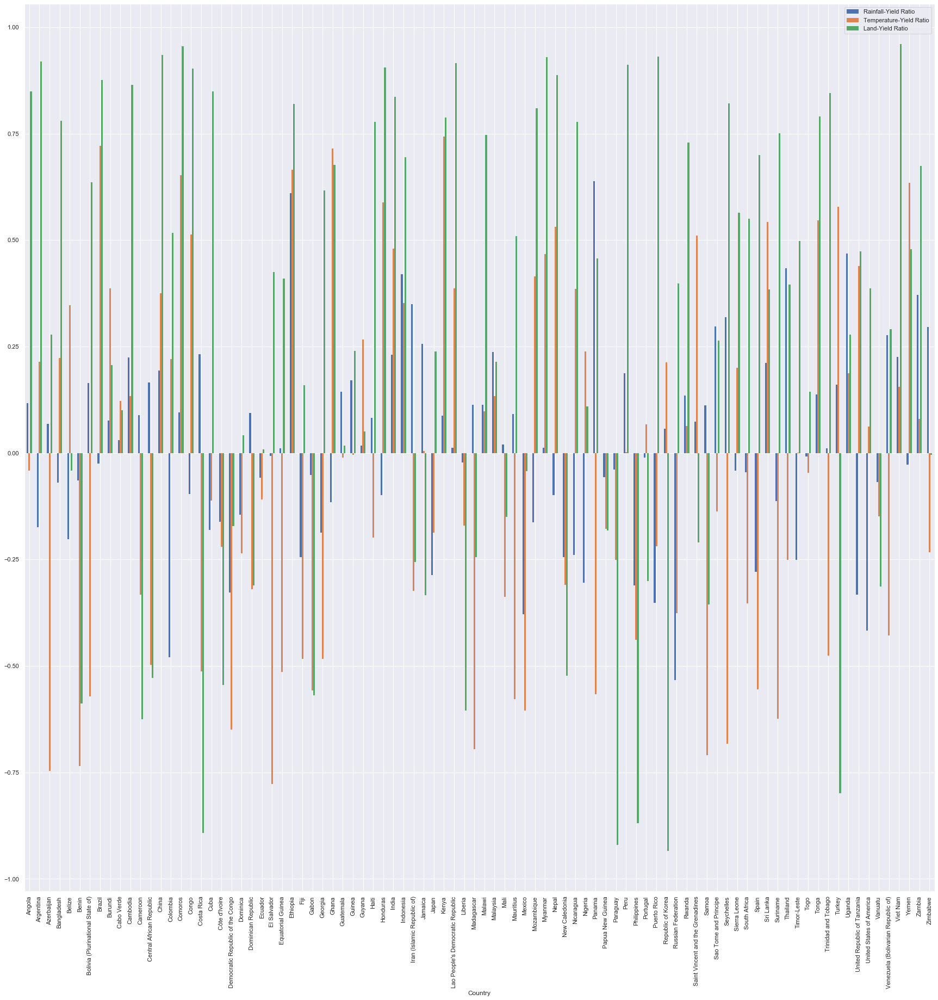

In [20]:
countriesOfInterest = caffeineMelted['Area'].unique()
countriesMeetingThreshold = []
tempCorr = pd.DataFrame()

# countryclimate = climate_melted[climate_melted['Area'] == country]
# countryclimate['Year']
climate_melted['Year'] = climate_melted['Year'].astype(str)

for country in countriesOfInterest:
    countryyield = caffeineMelted[caffeineMelted['Area'] == country]
    countryyield['Year'] = countryyield['Year'].astype(str)
    countryclimate = climate_melted[climate_melted['Area'] == country]
    countryclimate['Year'] = countryclimate['Year'].astype(str)
    countryharvested = areaHarvestedMelted[areaHarvestedMelted['Area'] == country]
    countryharvested['Year'] = countryharvested['Year'].astype(str)
    countrymerged = pd.merge(countryyield, countryclimate, on=["Year", "Area"], how='inner')
    countrymerged = countrymerged.merge(countryharvested, on=['Year', 'Area'], how='inner')

    countrymerged.drop(columns=['index'], inplace=True, errors='ignore')
    corr = countrymerged.corr()
    tempCorr = corr
    countriesMeetingThreshold.append([country, corr.iloc[1,0], corr.iloc[2,0], corr.iloc[3, 0]])    

countriesMeetingThreshold = pd.DataFrame(countriesMeetingThreshold, columns=['Country', 'Rainfall-Yield Ratio', 'Temperature-Yield Ratio', 'Land-Yield Ratio'])
countriesMeetingThreshold.dropna(inplace=True)
countriesMeetingThreshold.sort_values(by='Temperature-Yield Ratio', ascending=False)
countriesMeetingThreshold.set_index('Country', inplace=True)
countriesMeetingThreshold.plot.bar(edgecolor='none', figsize=(30, 30))

In [21]:
countriesMeetingThreshold.sort_values(by=['Rainfall-Yield Ratio', 'Temperature-Yield Ratio', 'Land-Yield Ratio'], ascending=False)

,Rainfall-Yield Ratio,Temperature-Yield Ratio,Land-Yield Ratio
Country,,,
Panama,0.63850,-0.56605,0.45652
Ethiopia,0.60962,0.66471,0.81977
Uganda,0.46825,0.18672,0.27858
Thailand,0.43433,-0.25099,0.39571
Indonesia,0.42013,0.35253,0.69449
...,...,...,...
Puerto Rico,-0.35210,-0.21944,0.93136
Mexico,-0.37841,-0.60408,-0.04308
United States of America,-0.41738,0.06258,0.38615


# Future Predictions

## Overall Crop Yields

### Linear Regression for Overall

In [22]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline

In [23]:
metric = 'Production'

In [24]:
countriesToTest = ['Kazakhstan', 'Republic of Korea', 'Namibia', 'Russia', 'Liberia', 'Somalia', 'Guinea-Bissau', 'India']

In [126]:
prodwithitem = prod_melted.groupby(['Year', 'Area', 'Item'])['Production'].sum().reset_index()
prodwithitem

,Year,Area,Item,Production
0,1961,Afghanistan,"Almonds, with shell",0.00000
1,1961,Afghanistan,"Anise, badian, fennel, coriander",0.00000
2,1961,Afghanistan,Apples,15100.00000
3,1961,Afghanistan,Apricots,32000.00000
4,1961,Afghanistan,Barley,378000.00000
...,...,...,...,...
997363,2018,Zimbabwe,Vanilla,10.00000
997364,2018,Zimbabwe,Vegetables Primary,247640.00000
997365,2018,Zimbabwe,"Vegetables, fresh nes",191725.00000
997366,2018,Zimbabwe,"Vegetables, leguminous nes",840.00000


In [136]:
def getRain(year, country):
    row = climate_melted[np.logical_and(climate_melted['Year'] == year, climate_melted['Area'] == country)]
    if(len(row) != 0):
        return row['Rainfall']
    else:
        return 'N/A'
def getTemp(year, country):
    row = climate_melted[np.logical_and(climate_melted['Year'] == year, climate_melted['Area'] == country)]
    if(len(row) != 0):
        return row['Temperature - (Celsius)']
    else:
        return 'N/A'
def writeRow(row):
    if(row['Year'] and row['Area']):
        row['Rainfall - (MM)'] = getRain(row['Year'], row['Area'])
        row['Temperature - (Celsius)'] = getTemp(row['Year'], row['Area'])

In [142]:
overallProd = prodwithitem.copy()
overallProd['Year'] = overallProd['Year'].astype(str)
overallClimate = climate_melted.copy()
overallClimate['Year'] = countryclimate['Year'].astype(str)
overallHarvested = areaHarvestedMelted.copy()[areaHarvestedMelted['Area'] == country]
overallHarvested['Year'] = countryharvested['Year'].astype(str)
#merge
overallmerged = overallProd.copy()
overallmerged.loc[:, 'Rainfall - (MM)'] = pd.Series()
overallmerged.loc[:, 'Temperature - (Celsius)'] = pd.Series()
overallmerged = overallmerged.apply(writeRow, axis=1)
overallmerged

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  if __name__ == '__main__':
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:10: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  # Remove the CWD from sys.path while we load stuff.


Year                                      1961
Area                               Afghanistan
Item                       Almonds, with shell
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 0, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                   1961
Area                                            Afghanistan
Item                       Anise, badian, fennel, coriander
Production                                          0.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 1, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                       Afghanistan
Item                            Apples
Production     

Index: []
Year                                      1961
Area                                    Africa
Item                       Carrots and turnips
Production                        316432.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 71, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                                        Africa
Item                       Cashew nuts, with shell
Production                            172050.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 72, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                            Africa
Item                       Cashewapple
Production                 49000.00000
Rainfall - (MM)   

Index: []
Year                                1961
Area                              Africa
Item                            Oilcrops
Production                21851340.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 140, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                          Africa
Item                       Oilcrops, Cake Equivalent
Production                             3650194.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 141, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1961
Area                                         Africa
Item                       Oilcrops, Oil Equivalent
Production                            49

Index: []
Year                             1961
Area                          Albania
Item                       Beans, dry
Production                 9247.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 211, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                            Albania
Item                       Beans, green
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 212, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                1961
Area                                             Albania
Item                       Broad beans, horse beans, dry
Production                                       0.00000
Rainfall - (MM)                                      NaN
Tempera

Index: []
Year                                      1961
Area                                   Algeria
Item                       Almonds, with shell
Production                          6000.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 283, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                          Algeria
Item                           Apples
Production                15400.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 284, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                          Algeria
Item                         Apricots
Production                12720.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 285, dtype: obje

Index: []
Year                                          1961
Area                                       Algeria
Item                       Tobacco, unmanufactured
Production                              3000.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 349, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                           Algeria
Item                          Tomatoes
Production                139720.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 350, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                               Algeria
Item                       Treenuts, Total
Production                      6000.00000
Rainfall - (MM)                        NaN
Tempe

Index: []
Year                              1961
Area                          Americas
Item                       Cereals nes
Production                 16200.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 415, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                             Americas
Item                       Cereals, Total
Production                227749328.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 416, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Americas
Item                          Cherries
Production                105967.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 417, dtype: object
Empty DataFrame

Index: []
Year                                             1961
Area                                         Americas
Item                       Nutmeg, mace and cardamoms
Production                                  627.00000
Rainfall - (MM)                                   NaN
Temperature - (Celsius)                           NaN
Name: 475, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Americas
Item                          Nuts nes
Production                122697.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 476, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                            Americas
Item                                Oats
Production                20006128.00000
Rainfall - (MM)                      N

Index: []
Year                           1961
Area                       Americas
Item                        Vanilla
Production                236.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 541, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1961
Area                                 Americas
Item                       Vegetables Primary
Production                     25931663.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 542, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                                    Americas
Item                       Vegetables, fresh nes
Production                         4459594.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)

Index: []
Year                                                  1961
Area                                   Antigua and Barbuda
Item                       Melons, other (inc.cantaloupes)
Production                                         0.00000
Rainfall - (MM)                                        NaN
Temperature - (Celsius)                                NaN
Name: 612, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                       Antigua and Barbuda
Item                                  Oilcrops
Production                           400.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 613, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                             Antigua and Barbuda
Item              

Index: []
Year                             1961
Area                        Argentina
Item                       Peppermint
Production                23000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 684, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                        Argentina
Item                       Pineapples
Production                 2000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 685, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                             Argentina
Item                       Plums and sloes
Production                     41700.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 686, dtype: object
Empty DataFrame
Colum

Index: []
Year                                  1961
Area                               Armenia
Item                       Plums and sloes
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 754, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                        Armenia
Item                       Potatoes
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 755, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                          Armenia
Item                       Pulses nes
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 756, dtype: object
Empty DataFrame
Columns: [Year, A

Index: []
Year                                1961
Area                                Asia
Item                       Cow peas, dry
Production                   34011.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 819, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                              Asia
Item                       Cranberries
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 820, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                         Asia
Item                       Cucumbers and gherkins
Production                          6043859.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)       

Index: []
Year                              1961
Area                              Asia
Item                        Persimmons
Production                904041.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 885, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                               Asia
Item                        Pigeon peas
Production                2108109.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 886, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                               Asia
Item                         Pineapples
Production                1244660.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 887, dtype: object
Empty DataFrame
Colum

Year                             1961
Area                        Australia
Item                       Beans, dry
Production                  447.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 949, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                          Australia
Item                       Beans, green
Production                  31840.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 950, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                         Australia
Item                       Berries nes
Production                  1555.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 951, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainf

Index: []
Year                              1961
Area                         Australia
Item                           Sorghum
Production                163187.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 1021, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                       Australia
Item                        Soybeans
Production                 200.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 1022, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                       Australia
Item                         Spinach
Production                1669.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 1023, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM),

Index: []
Year                                            1961
Area                       Australia and New Zealand
Item                                          Millet
Production                               21827.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 1092, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                       Australia and New Zealand
Item                          Mushrooms and truffles
Production                                 300.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 1093, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                       Australia and New Zealand
Item            

Index: []
Year                                 1961
Area                              Austria
Item                       Cherries, sour
Production                     3498.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 1161, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1961
Area                                           Austria
Item                       Chillies and peppers, green
Production                                  5257.00000
Rainfall - (MM)                                    NaN
Temperature - (Celsius)                            NaN
Name: 1162, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                      Austria
Item                       Cucumbers and gherkins
Production                

Index: []
Year                              1961
Area                        Azerbaijan
Item                       Berries nes
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 1230, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                1961
Area                                          Azerbaijan
Item                       Broad beans, horse beans, dry
Production                                       0.00000
Rainfall - (MM)                                      NaN
Temperature - (Celsius)                              NaN
Name: 1231, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                               1961
Area                                         Azerbaijan
Item                       Cabbages and other brassicas
Production    

Index: []
Year                                  1961
Area                            Azerbaijan
Item                       Treenuts, Total
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 1297, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1961
Area                               Azerbaijan
Item                       Vegetables Primary
Production                            0.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 1298, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                                  Azerbaijan
Item                       Vegetables, fresh nes
Production                               0.00000
Rainfall - (MM)             

Index: []
Year                                          1961
Area                                       Bahrain
Item                       Roots and Tubers, Total
Production                                20.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 1363, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                              Bahrain
Item                       Sweet potatoes
Production                       20.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 1364, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                         Bahrain
Item                        Tomatoes
Production                1000.00000
Rainfall - (MM)                  NaN
Temperature - (

Index: []
Year                              1961
Area                        Bangladesh
Item                       Sesame seed
Production                 26416.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 1429, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                       Bangladesh
Item                          Sorghum
Production                 1016.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 1430, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                       Bangladesh
Item                         Soybeans
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 1431, dtype: object
Empty DataFrame
Columns: [Year, Area, Rain

Index: []
Year                                     1961
Area                                  Belarus
Item                       Flax fibre and tow
Production                            0.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 1495, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                             Belarus
Item                       Fruit Primary
Production                       0.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 1496, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                               Belarus
Item                       Fruit, pome nes
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsiu

Index: []
Year                                      1961
Area                                   Belgium
Item                       Lettuce and chicory
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 1566, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1961
Area                       Belgium
Item                       Linseed
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 1567, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1961
Area                       Belgium
Item                         Maize
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 1568, dtype: object
Empty DataFrame
Columns: [Year

Index: []
Year                                     1961
Area                       Belgium-Luxembourg
Item                              Onions, dry
Production                        24600.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 1635, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                            Belgium-Luxembourg
Item                       Onions, shallots, green
Production                                 0.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 1636, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                           Belgium-Luxembourg
Item                       Peaches and nectarines
Production                

Index: []
Year                                                       1961
Area                                                     Belize
Item                       Rice, paddy (rice milled equivalent)
Production                                            566.00000
Rainfall - (MM)                                             NaN
Temperature - (Celsius)                                     NaN
Name: 1701, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                                        Belize
Item                       Roots and Tubers, Total
Production                              1600.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 1702, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1961
Area                

Index: []
Year                                 1961
Area                                Benin
Item                       Taro (cocoyam)
Production                     8000.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 1764, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                                         Benin
Item                       Tobacco, unmanufactured
Production                               731.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 1765, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                           Benin
Item                        Tomatoes
Production                3390.00000
Rainfall - (MM)                  NaN
Temperature - (

Index: []
Year                                       1961
Area                                     Bhutan
Item                       Roots and tubers nes
Production                          10800.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 1830, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                         Bhutan
Item                       Soybeans
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 1831, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                           Bhutan
Item                       Spices nes
Production                 1280.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 1832, dtype: object


Index: []
Year                                                   1961
Area                       Bolivia (Plurinational State of)
Item                                   Plantains and others
Production                                      33000.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 1894, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                   1961
Area                       Bolivia (Plurinational State of)
Item                                        Plums and sloes
Production                                        500.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 1895, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  

Index: []
Year                                         1961
Area                       Bosnia and Herzegovina
Item                                Fruit Primary
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 1956, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                       Bosnia and Herzegovina
Item                             Fruit, fresh nes
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 1957, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                       Bosnia and Herzegovina
Item                                       Garlic
Producti

Index: []
Year                                     1961
Area                                 Botswana
Item                       Vegetables Primary
Production                         8900.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 2027, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                                    Botswana
Item                       Vegetables, fresh nes
Production                            8300.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 2028, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Botswana
Item                       Watermelons
Production                     0.00000
Rainfall - (MM)                 

Index: []
Year                              1961
Area                            Brazil
Item                       Sesame seed
Production                  3000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 2098, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                            Brazil
Item                             Sisal
Production                164200.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 2099, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1961
Area                        Brazil
Item                       Sorghum
Production                 5.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 2100, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM),

Index: []
Year                              1961
Area                          Bulgaria
Item                            Apples
Production                272703.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 2166, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                         Bulgaria
Item                         Apricots
Production                47874.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 2167, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                        Bulgaria
Item                       Asparagus
Production                   0.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 2168, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall -

Index: []
Year                                              1961
Area                                          Bulgaria
Item                       Pumpkins, squash and gourds
Production                                188773.00000
Rainfall - (MM)                                    NaN
Temperature - (Celsius)                            NaN
Name: 2233, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                         Bulgaria
Item                          Quinces
Production                32957.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 2234, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                         Bulgaria
Item                         Rapeseed
Production                14830.00000
Rainfall - (MM)                   NaN
Temperatur

Index: []
Year                               1961
Area                       Burkina Faso
Item                           Soybeans
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 2299, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                       Burkina Faso
Item                         Spices nes
Production                   4000.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 2300, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                              Burkina Faso
Item                       Sugar Crops Primary
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    

Index: []
Year                             1961
Area                       Cabo Verde
Item                           Garlic
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 2363, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                   Cabo Verde
Item                       Groundnuts, with shell
Production                              300.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 2364, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                Cabo Verde
Item                       Lettuce and chicory
Production                             0.00000
Rainfall - (MM)                           

Index: []
Year                              1961
Area                          Cambodia
Item                        Sugar cane
Production                230000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 2423, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                             Cambodia
Item                       Sweet potatoes
Production                    27000.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 2424, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                                      Cambodia
Item                       Tobacco, unmanufactured
Production                              5661.00000
Rainfall - (MM)                                NaN
Temperature - (Ce

Index: []
Year                              1961
Area                          Cameroon
Item                       Seed cotton
Production                 25100.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 2493, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Cameroon
Item                       Sesame seed
Production                  2532.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 2494, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Cameroon
Item                           Sorghum
Production                255000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 2495, dtype: object
Empty DataFrame
Columns: [Year

Index: []
Year                              1961
Area                            Canada
Item                          Rapeseed
Production                254464.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 2564, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                            Canada
Item                       Raspberries
Production                  6489.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 2565, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                                        Canada
Item                       Roots and Tubers, Total
Production                           2012000.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)            

Index: []
Year                                                  1961
Area                                             Caribbean
Item                       Melons, other (inc.cantaloupes)
Production                                     21000.00000
Rainfall - (MM)                                        NaN
Temperature - (Celsius)                                NaN
Name: 2630, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                       Caribbean
Item                          Millet
Production                   0.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 2631, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1961
Area                                        Caribbean
Item                       Nutmeg, mace and cardamoms
Production          

Year                                          1961
Area                                Cayman Islands
Item                       Roots and Tubers, Total
Production                                 0.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 2694, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                       Cayman Islands
Item                       Sweet potatoes
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 2695, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                       Cayman Islands
Item                             Tomatoes
Production                        0.00000
Rainfall - (MM)                       NaN


Index: []
Year                                  1961
Area                       Central America
Item                                Barley
Production                    174182.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 2755, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                    1961
Area                         Central America
Item                       Bastfibres, other
Production                        1900.00000
Rainfall - (MM)                          NaN
Temperature - (Celsius)                  NaN
Name: 2756, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       Central America
Item                            Beans, dry
Production                    878409.00000
Rainfall - (MM)                        NaN
Temperature - (

Index: []
Year                                  1961
Area                       Central America
Item                                  Oats
Production                     68395.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 2814, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       Central America
Item                        Oil palm fruit
Production                    290623.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 2815, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       Central America
Item                              Oilcrops
Production                   3252196.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)    

Index: []
Year                                  1961
Area                       Central America
Item                               Vanilla
Production                       232.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 2873, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1961
Area                          Central America
Item                       Vegetables Primary
Production                      1244989.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 2874, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                             Central America
Item                       Vegetables, fresh nes
Production                          161602.00000
Rainfall - (MM)             

Index: []
Year                                           1961
Area                                   Central Asia
Item                       Oilcrops, Oil Equivalent
Production                                  0.00000
Rainfall - (MM)                                 NaN
Temperature - (Celsius)                         NaN
Name: 2941, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                       Central Asia
Item                       Oilseeds nes
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 2942, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                       Central Asia
Item                             Olives
Production                      0.00000
Rainfall - (MM)                     NaN
Temper

Index: []
Year                              1961
Area                              Chad
Item                       Seed cotton
Production                 46763.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 3012, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                              Chad
Item                       Sesame seed
Production                  5000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 3013, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                              Chad
Item                           Sorghum
Production                398000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 3014, dtype: object
Empty DataFrame
Columns: [Year

Index: []
Year                                         1961
Area                                        Chile
Item                       Peaches and nectarines
Production                            60000.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 3077, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                            Chile
Item                            Pears
Production                19000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 3078, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                           Chile
Item                       Peas, dry
Production                6838.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 30

Index: []
Year                               1961
Area                              China
Item                       Cocoa, beans
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 3143, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                            China
Item                         Coconuts
Production                35000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 3144, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                               China
Item                       Coffee, green
Production                    1612.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 3145, dtype: object
Empty DataFrame
Co

Index: []
Year                                1961
Area                               China
Item                            Potatoes
Production                12907173.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 3206, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                            China
Item                       Pulses nes
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 3207, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                               China
Item                       Pulses, Total
Production                 8520593.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 3208, dtype: object
Empty DataFr

Index: []
Year                                       1961
Area                       China, Hong Kong SAR
Item                                 Spices nes
Production                            600.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 3265, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1961
Area                       China, Hong Kong SAR
Item                                    Spinach
Production                           3315.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 3266, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1961
Area                       China, Hong Kong SAR
Item                             Sweet potatoes
Production                          34

Index: []
Year                                            1961
Area                       China, Taiwan Province of
Item                        Oilcrops, Oil Equivalent
Production                               47394.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 3329, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                       China, Taiwan Province of
Item                                    Oilseeds nes
Production                                3000.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 3330, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                       China, Taiwan Province of
Item            

Index: []
Year                                  1961
Area                       China, mainland
Item                              Cherries
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 3397, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       China, mainland
Item                              Chestnut
Production                    129000.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 3398, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       China, mainland
Item                            Chick peas
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)    

Index: []
Year                                  1961
Area                       China, mainland
Item                            Pulses nes
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 3466, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       China, mainland
Item                         Pulses, Total
Production                   8500000.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 3467, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1961
Area                                   China, mainland
Item                       Pumpkins, squash and gourds
Production                                440000.00000
Rainfall - (MM)       

Index: []
Year                                         1961
Area                                     Colombia
Item                       Cucumbers and gherkins
Production                             1800.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 3530, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                       Colombia
Item                          Dates
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 3531, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                     Colombia
Item                       Eggplants (aubergines)
Production                             1600.00000
Rainfall - (MM)                           

Index: []
Year                                 1961
Area                              Comoros
Item                       Cereals, Total
Production                    11300.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 3600, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                   Comoros
Item                       Cinnamon (cannella)
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 3601, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1961
Area                       Comoros
Item                        Cloves
Production                70.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 3602, dt

Index: []
Year                             1961
Area                            Congo
Item                       Pineapples
Production                 4800.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 3666, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1961
Area                                      Congo
Item                       Plantains and others
Production                          27000.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 3667, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                          Congo
Item                       Potatoes
Production                 80.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 3668, dtype: object


Index: []
Year                                      1961
Area                                Costa Rica
Item                       Fibre Crops Primary
Production                          1726.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 3733, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                          Costa Rica
Item                       Fruit Primary
Production                  488039.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 3734, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                             Costa Rica
Item                       Fruit, fresh nes
Production                       4100.00000
Rainfall - (MM)                         NaN
Temperatur

Year                                 1961
Area                              Croatia
Item                       Cereals, Total
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 3798, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                        Croatia
Item                       Cherries
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 3799, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                              Croatia
Item                       Cherries, sour
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 3800, dtype: object
Empty DataFrame
Column

Index: []
Year                                      1961
Area                                      Cuba
Item                       Citrus Fruit, Total
Production                         93000.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 3873, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                               Cuba
Item                       Cocoa, beans
Production                   2500.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 3874, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                             Cuba
Item                         Coconuts
Production                10000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 38

Index: []
Year                                    1961
Area                                  Cyprus
Item                       Fruit, citrus nes
Production                        1600.00000
Rainfall - (MM)                          NaN
Temperature - (Celsius)                  NaN
Name: 3946, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                                 Cyprus
Item                       Fruit, fresh nes
Production                       2626.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 3947, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                          Cyprus
Item                       Fruit, tropical fresh nes
Production                                   0.00000
Rainfall - (

Index: []
Year                            1961
Area                         Czechia
Item                       Buckwheat
Production                   0.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 4011, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                               1961
Area                                            Czechia
Item                       Cabbages and other brassicas
Production                                      0.00000
Rainfall - (MM)                                     NaN
Temperature - (Celsius)                             NaN
Name: 4012, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                           Czechia
Item                       Canary seed
Production                     0.00000
Rainfall - (MM)                    NaN
Tempe

Index: []
Year                          1961
Area                       Czechia
Item                       Vetches
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 4078, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                   Czechia
Item                       Walnuts, with shell
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 4079, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1961
Area                       Czechia
Item                         Wheat
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 4080, dtype: object
Empty DataFrame
Columns: [Year

Index: []
Year                                 1961
Area                       Czechoslovakia
Item                             Tomatoes
Production                    84668.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 4146, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                        Czechoslovakia
Item                       Treenuts, Total
Production                     22348.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 4147, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                       Czechoslovakia
Item                            Triticale
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               

Index: []
Year                                1961
Area                       Côte d'Ivoire
Item                         Sesame seed
Production                    2000.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 4212, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                       Côte d'Ivoire
Item                             Sorghum
Production                    8000.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 4213, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                       Côte d'Ivoire
Item                            Soybeans
Production                       0.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 4214, dtype: o

Index: []
Year                                                   1961
Area                       Democratic Republic of the Congo
Item                                                 Barley
Production                                        439.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 4278, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                   1961
Area                       Democratic Republic of the Congo
Item                                      Bastfibres, other
Production                                      10909.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 4279, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  

Index: []
Year                                                   1961
Area                       Democratic Republic of the Congo
Item                                  Vegetables, fresh nes
Production                                     235000.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 4340, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                   1961
Area                       Democratic Republic of the Congo
Item                                                  Wheat
Production                                       2127.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 4341, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  

Index: []
Year                                      1961
Area                                  Djibouti
Item                       Carrots and turnips
Production                             2.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 4402, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                             Djibouti
Item                       Cereals, Total
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 4403, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                        Djibouti
Item                       Chillies and peppers, dry
Production                                  10.00000
Rainfall - (

Index: []
Year                                 1961
Area                             Dominica
Item                       Taro (cocoyam)
Production                     8500.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 4471, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                       Dominica
Item                       Tomatoes
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 4472, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                              Dominica
Item                       Treenuts, Total
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 4473, dtype: object
Empty 

Index: []
Year                                     1961
Area                       Dominican Republic
Item                               Sugar cane
Production                      7811195.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 4535, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1961
Area                       Dominican Republic
Item                           Sweet potatoes
Production                        71800.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 4536, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                            Dominican Republic
Item                       Tobacco, unmanufactured
Production                             29393.00000
Ra

Index: []
Year                                 1961
Area                       Eastern Africa
Item                                Maize
Production                  5689834.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 4602, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                       Eastern Africa
Item                         Maize, green
Production                     9000.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 4603, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                               1961
Area                                     Eastern Africa
Item                       Mangoes, mangosteens, guavas
Production                                 220914.00000
Rainfall - (MM)               

Index: []
Year                                     1961
Area                           Eastern Africa
Item                       Vegetables Primary
Production                      2263028.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 4669, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                              Eastern Africa
Item                       Vegetables, fresh nes
Production                         1977820.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 4670, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1961
Area                                   Eastern Africa
Item                       Vegetables, leguminous nes
Production                

Index: []
Year                                        1961
Area                                Eastern Asia
Item                       Hazelnuts, with shell
Production                            2000.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 4732, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                         Eastern Asia
Item                       Hemp tow waste
Production                    54289.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 4733, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                       Eastern Asia
Item                           Hempseed
Production                  27000.00000
Rainfall - (MM)                     NaN
Temperature 

Index: []
Year                                 1961
Area                         Eastern Asia
Item                       Sweet potatoes
Production                 84827737.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 4802, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                          Eastern Asia
Item                       Tallowtree seed
Production                    620000.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 4803, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                               1961
Area                                                       Eastern Asia
Item                       Tangerines, mandarins, clementines, satsumas
Production                      

Index: []
Year                                 1961
Area                       Eastern Europe
Item                           Kiwi fruit
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 4871, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                     1961
Area                                           Eastern Europe
Item                       Leeks, other alliaceous vegetables
Production                                            0.00000
Rainfall - (MM)                                           NaN
Temperature - (Celsius)                                   NaN
Name: 4872, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                       Eastern Europe
Item                              Lentils
Producti

Index: []
Year                                 1961
Area                       Eastern Europe
Item                          Watermelons
Production                  2467183.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 4937, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                       Eastern Europe
Item                                Wheat
Production                 74917990.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 4938, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                                Ecuador
Item                       Agave fibres nes
Production                          0.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)           

Index: []
Year                           1961
Area                        Ecuador
Item                         Quinoa
Production                741.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 5003, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                           Ecuador
Item                       Rice, paddy
Production                203000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 5004, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                       1961
Area                                                    Ecuador
Item                       Rice, paddy (rice milled equivalent)
Production                                         135401.00000
Rainfall - (MM)                                     

Index: []
Year                                   1961
Area                                  Egypt
Item                       Lemons and limes
Production                      40000.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 5065, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                            Egypt
Item                          Lentils
Production                34434.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 5066, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                     Egypt
Item                       Lettuce and chicory
Production                         32000.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)        

Index: []
Year                                      1961
Area                               El Salvador
Item                       Citrus Fruit, Total
Production                         40200.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 5132, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                        El Salvador
Item                       Cocoa, beans
Production                    300.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 5133, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                       El Salvador
Item                          Coconuts
Production                 19200.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Na

Index: []
Year                             1961
Area                          Eritrea
Item                       Chick peas
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 5200, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                             Eritrea
Item                       Fruit Primary
Production                       0.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 5201, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                                Eritrea
Item                       Fruit, fresh nes
Production                          0.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 5202, dtype: o

Index: []
Year                                          1961
Area                                       Estonia
Item                       Roots and Tubers, Total
Production                                 0.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 5263, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1961
Area                                    Estonia
Item                       Roots and tubers nes
Production                              0.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 5264, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1961
Area                       Estonia
Item                           Rye
Production                 0.00000
Rainfall - (MM)         

Index: []
Year                             1961
Area                         Ethiopia
Item                       Chick peas
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 5329, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                        Ethiopia
Item                       Chillies and peppers, dry
Production                                   0.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 5330, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1961
Area                                          Ethiopia
Item                       Chillies and peppers, green
Production                                     

Index: []
Year                                     1961
Area                                 Ethiopia
Item                       Vegetables Primary
Production                            0.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 5396, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                                    Ethiopia
Item                       Vegetables, fresh nes
Production                               0.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 5397, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1961
Area                                         Ethiopia
Item                       Vegetables, leguminous nes
Production                

Index: []
Year                                  1961
Area                          Ethiopia PDR
Item                       Treenuts, Total
Production                     19500.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 5466, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1961
Area                             Ethiopia PDR
Item                       Vegetables Primary
Production                       273000.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 5467, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                                Ethiopia PDR
Item                       Vegetables, fresh nes
Production                          200000.00000
Rainfall - (MM)             

Index: []
Year                                                     1961
Area                                                   Europe
Item                       Leeks, other alliaceous vegetables
Production                                       452370.00000
Rainfall - (MM)                                           NaN
Temperature - (Celsius)                                   NaN
Name: 5533, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                                 Europe
Item                       Lemons and limes
Production                     771960.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 5534, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                           Europe
Item                          Lentils
Producti

Index: []
Year                          1961
Area                        Europe
Item                       Vanilla
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 5604, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1961
Area                                   Europe
Item                       Vegetables Primary
Production                     61395516.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 5605, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                                      Europe
Item                       Vegetables, fresh nes
Production                        13976114.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)    

Index: []
Year                                      1961
Area                       European Union (28)
Item                            Hemp tow waste
Production                         87592.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 5670, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                       European Union (28)
Item                                  Hempseed
Production                         11646.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 5671, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                       European Union (28)
Item                                      Hops
Production                         30255.00000
Rainfa

Index: []
Year                                      1961
Area                       European Union (28)
Item                            Sweet potatoes
Production                        193120.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 5737, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                               1961
Area                                                European Union (28)
Item                       Tangerines, mandarins, clementines, satsumas
Production                                                 306508.00000
Rainfall - (MM)                                                     NaN
Temperature - (Celsius)                                             NaN
Name: 5738, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      19

Index: []
Year                              1961
Area                              Fiji
Item                       Watermelons
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 5803, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                           Fiji
Item                           Yams
Production                800.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 5804, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                          Finland
Item                           Apples
Production                35000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 5805, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM),

Index: []
Year                                               1961
Area                                             France
Item                       Cabbages and other brassicas
Production                                 596720.00000
Rainfall - (MM)                                     NaN
Temperature - (Celsius)                             NaN
Name: 5862, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                    France
Item                       Carrots and turnips
Production                        606350.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 5863, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                          France
Item                       Caulifl

Index: []
Year                              1961
Area                            France
Item                          Rapeseed
Production                106519.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 5926, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                            France
Item                       Raspberries
Production                  3910.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 5927, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                            France
Item                       Rice, paddy
Production                133690.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 5928, dtype: object
Empty DataFrame
Columns: [Year

Index: []
Year                                                               1961
Area                                                      French Guyana
Item                       Tangerines, mandarins, clementines, satsumas
Production                                                     10.00000
Rainfall - (MM)                                                     NaN
Temperature - (Celsius)                                             NaN
Name: 5989, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                        French Guyana
Item                       Taro (cocoyam)
Production                     7000.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 5990, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                       French

Index: []
Year                                          1961
Area                                         Gabon
Item                       Roots and Tubers, Total
Production                            197000.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 6053, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                                 Gabon
Item                       Rubber, natural
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 6054, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                          Gabon
Item                       Soybeans
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - 

Index: []
Year                          1961
Area                       Georgia
Item                        Grapes
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 6118, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                      Georgia
Item                       Groundnuts, with shell
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 6119, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                                     Georgia
Item                       Hazelnuts, with shell
Production                               0.00000
Rainfall - (MM)                              NaN
Tem

Index: []
Year                               1961
Area                            Germany
Item                       Grain, mixed
Production                1697670.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 6183, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                           Germany
Item                            Grapes
Production                482500.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 6184, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                                     Germany
Item                       Hazelnuts, with shell
Production                              85.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                

Index: []
Year                              1961
Area                             Ghana
Item                          Coconuts
Production                236000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 6248, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                               Ghana
Item                       Coffee, green
Production                    1700.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 6249, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                         1961
Area                        Ghana
Item                         Coir
Production                0.00000
Rainfall - (MM)               NaN
Temperature - (Celsius)       NaN
Name: 6250, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall -

Index: []
Year                                                1961
Area                                              Greece
Item                       Broad beans, horse beans, dry
Production                                   29620.00000
Rainfall - (MM)                                      NaN
Temperature - (Celsius)                              NaN
Name: 6314, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                          Greece
Item                       Buckwheat
Production                   0.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 6315, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                               1961
Area                                             Greece
Item                       Cabbages and other brassicas
Production                

Index: []
Year                                  1961
Area                                Greece
Item                       Plums and sloes
Production                     28295.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 6372, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                            Greece
Item                          Potatoes
Production                400184.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 6373, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                           Greece
Item                       Pulses nes
Production                18595.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 6374, dtype: object
Empty DataFr

Index: []
Year                                           1961
Area                                        Grenada
Item                       Oilcrops, Oil Equivalent
Production                                807.00000
Rainfall - (MM)                                 NaN
Temperature - (Celsius)                         NaN
Name: 6438, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                        Grenada
Item                        Oranges
Production                760.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 6439, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1961
Area                       Grenada
Item                       Papayas
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 6440, dtype: o

Index: []
Year                                  1961
Area                            Guadeloupe
Item                       Treenuts, Total
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 6506, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                       Guadeloupe
Item                          Vanilla
Production                    4.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 6507, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1961
Area                               Guadeloupe
Item                       Vegetables Primary
Production                         7030.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   

Index: []
Year                                         1961
Area                                    Guatemala
Item                       Groundnuts, with shell
Production                              500.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 6572, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                              Guatemala
Item                       Lemons and limes
Production                          0.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 6573, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                 Guatemala
Item                       Lettuce and chicory
Production                          5200.00000
Rainfa

Index: []
Year                           1961
Area                         Guinea
Item                       Nuts nes
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 6638, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                               Guinea
Item                       Oil palm fruit
Production                   600000.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 6639, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                            Guinea
Item                          Oilcrops
Production                678808.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 6640, dtype: object
Empty DataFrame
Columns: [Year

Index: []
Year                                      1961
Area                             Guinea-Bissau
Item                       Sugar Crops Primary
Production                          3500.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 6699, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                       Guinea-Bissau
Item                          Sugar cane
Production                    3500.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 6700, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                         Guinea-Bissau
Item                       Treenuts, Total
Production                      2000.00000
Rainfall - (MM)                        NaN
Temperature - (

Index: []
Year                             1961
Area                            Haiti
Item                         Avocados
Production                40000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 6762, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                             Haiti
Item                           Bananas
Production                110000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 6763, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                            Haiti
Item                       Beans, dry
Production                37500.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 6764, dtype: object
Empty DataFrame
Columns: [Year, Area, Rain

Index: []
Year                                 1961
Area                             Honduras
Item                       Cereals, Total
Production                   318005.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 6827, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1961
Area                                          Honduras
Item                       Chillies and peppers, green
Production                                     0.00000
Rainfall - (MM)                                    NaN
Temperature - (Celsius)                            NaN
Name: 6828, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                  Honduras
Item                       Citrus Fruit, Total
Production                         

Index: []
Year                              1961
Area                           Hungary
Item                       Cereals nes
Production                 12000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 6896, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                              Hungary
Item                       Cereals, Total
Production                  6174805.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 6897, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                          Hungary
Item                         Cherries
Production                45500.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 6898, dtype: object
Empty DataFrame
Co

Index: []
Year                            1961
Area                         Hungary
Item                         Spinach
Production                8321.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 6961, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                            Hungary
Item                       Strawberries
Production                   9100.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 6962, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                   Hungary
Item                       Sugar Crops Primary
Production                       2355544.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 6963, dt

Index: []
Year                                   1961
Area                                  India
Item                       Lemons and limes
Production                     415000.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 7031, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                             India
Item                           Lentils
Production                358666.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 7032, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                     India
Item                       Lettuce and chicory
Production                        250000.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)  

Index: []
Year                                            1961
Area                                       Indonesia
Item                       Chillies and peppers, dry
Production                                4000.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 7099, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1961
Area                                         Indonesia
Item                       Chillies and peppers, green
Production                                 90000.00000
Rainfall - (MM)                                    NaN
Temperature - (Celsius)                            NaN
Name: 7100, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                 Indonesia
Item            

Index: []
Year                                                   1961
Area                             Iran (Islamic Republic of)
Item                       Anise, badian, fennel, coriander
Production                                       6500.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 7162, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1961
Area                       Iran (Islamic Republic of)
Item                                           Apples
Production                                65000.00000
Rainfall - (MM)                                   NaN
Temperature - (Celsius)                           NaN
Name: 7163, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1961
Area                

Index: []
Year                                             1961
Area                       Iran (Islamic Republic of)
Item                                       Pistachios
Production                                 6000.00000
Rainfall - (MM)                                   NaN
Temperature - (Celsius)                           NaN
Name: 7229, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1961
Area                       Iran (Islamic Republic of)
Item                                  Plums and sloes
Production                                38000.00000
Rainfall - (MM)                                   NaN
Temperature - (Celsius)                           NaN
Name: 7230, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1961
Area                       Iran (Islamic Republic of)
It

Index: []
Year                                         1961
Area                                         Iraq
Item                       Groundnuts, with shell
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 7289, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                                   Iraq
Item                       Lemons and limes
Production                       6000.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 7290, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                            Iraq
Item                         Lentils
Production                7300.00000
Rainfall - (MM)                  NaN
Temperatu

Index: []
Year                                      1961
Area                                   Ireland
Item                       Lettuce and chicory
Production                           200.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 7359, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                      Ireland
Item                       Mushrooms and truffles
Production                             5000.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 7360, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                           Ireland
Item                              Oats
Production                381400.00000
Rainfall - (MM)     

Index: []
Year                             1961
Area                           Israel
Item                         Oilcrops
Production                79400.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 7429, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                          Israel
Item                       Oilcrops, Cake Equivalent
Production                               20770.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 7430, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1961
Area                                         Israel
Item                       Oilcrops, Oil Equivalent
Production                              15257.00000
Rain

Index: []
Year                                              1961
Area                                             Italy
Item                       Chillies and peppers, green
Production                                231100.00000
Rainfall - (MM)                                    NaN
Temperature - (Celsius)                            NaN
Name: 7496, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                     Italy
Item                       Citrus Fruit, Total
Production                       1477071.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 7497, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                        Italy
Item                       Cucumbers and gherk

Index: []
Year                                 1961
Area                                Italy
Item                       Sweet potatoes
Production                    27260.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 7567, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                               1961
Area                                                              Italy
Item                       Tangerines, mandarins, clementines, satsumas
Production                                                 127500.00000
Rainfall - (MM)                                                     NaN
Temperature - (Celsius)                                             NaN
Name: 7568, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                   

Index: []
Year                               1961
Area                            Jamaica
Item                       String beans
Production                     50.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 7633, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                   Jamaica
Item                       Sugar Crops Primary
Production                       4438093.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 7634, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                            Jamaica
Item                         Sugar cane
Production                4438093.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             

Index: []
Year                             1961
Area                            Japan
Item                        Peas, dry
Production                20900.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 7702, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                             Japan
Item                       Peas, green
Production                112800.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 7703, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                            Japan
Item                       Peppermint
Production                37000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 7704, dtype: object
Empty DataFrame
Columns: [Year, Area, Rain

Index: []
Year                                         1961
Area                                       Jordan
Item                       Eggplants (aubergines)
Production                            51800.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 7765, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                           Jordan
Item                             Figs
Production                21000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 7766, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                              Jordan
Item                       Fruit Primary
Production                  240657.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)  

Index: []
Year                                 1961
Area                           Kazakhstan
Item                       Cherries, sour
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 7835, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                       Kazakhstan
Item                       Chick peas
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 7836, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                          Kazakhstan
Item                       Chicory roots
Production                       0.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 7837, dtype: object
Empty 

Index: []
Year                              1961
Area                             Kenya
Item                           Bananas
Production                400000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 7905, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                            Kenya
Item                           Barley
Production                13513.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 7906, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                            Kenya
Item                       Beans, dry
Production                55000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 7907, dtype: object
Empty DataFrame
Columns: [Year, Area, Rain

Index: []
Year                              1961
Area                             Kenya
Item                       Sesame seed
Production                  1829.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 7975, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                            Kenya
Item                            Sisal
Production                63100.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 7976, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                             Kenya
Item                           Sorghum
Production                164000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 7977, dtype: object
Empty DataFrame
Columns: [Year, Area

Index: []
Year                                              1961
Area                                            Kuwait
Item                       Pumpkins, squash and gourds
Production                                     0.00000
Rainfall - (MM)                                    NaN
Temperature - (Celsius)                            NaN
Name: 8041, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                                        Kuwait
Item                       Roots and Tubers, Total
Production                                 0.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 8042, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                           Kuwait
Item                       Spices nes
Producti

Index: []
Year                             1961
Area                       Kyrgyzstan
Item                       Pulses nes
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 8110, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                          Kyrgyzstan
Item                       Pulses, Total
Production                       0.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 8111, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1961
Area                                        Kyrgyzstan
Item                       Pumpkins, squash and gourds
Production                                     0.00000
Rainfall - (MM)                                    NaN
Temperatu

Index: []
Year                                                   1961
Area                       Land Locked Developing Countries
Item                                          Cow peas, dry
Production                                     215809.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 8178, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                   1961
Area                       Land Locked Developing Countries
Item                                            Cranberries
Production                                          0.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 8179, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  

Index: []
Year                                                   1961
Area                       Land Locked Developing Countries
Item                                   Plantains and others
Production                                    4823976.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 8244, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                   1961
Area                       Land Locked Developing Countries
Item                                        Plums and sloes
Production                                      31600.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 8245, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  

Index: []
Year                                                   1961
Area                       Lao People's Democratic Republic
Item                           Mangoes, mangosteens, guavas
Production                                        504.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 8311, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                   1961
Area                       Lao People's Democratic Republic
Item                        Melons, other (inc.cantaloupes)
Production                                       1500.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 8312, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  

Index: []
Year                              1961
Area                            Latvia
Item                       Peas, green
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 8378, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                                Latvia
Item                       Plums and sloes
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 8379, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                         Latvia
Item                       Potatoes
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 8380, dtype: object
Empty DataFrame
Columns:

Year                                            1961
Area                       Least Developed Countries
Item                                 Fibre crops nes
Production                               49145.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 8445, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                       Least Developed Countries
Item                                            Figs
Production                                8000.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 8446, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                       Least Developed Countries
Item                      

Index: []
Year                                            1961
Area                       Least Developed Countries
Item                                  Safflower seed
Production                               26000.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 8516, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                       Least Developed Countries
Item                                     Seed cotton
Production                             1131618.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 8517, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                       Least Developed Countries
Item            

Index: []
Year                             1961
Area                          Lebanon
Item                         Oilcrops
Production                67650.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 8586, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                         Lebanon
Item                       Oilcrops, Cake Equivalent
Production                                1082.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 8587, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1961
Area                                        Lebanon
Item                       Oilcrops, Oil Equivalent
Production                              15175.00000
Rain

Index: []
Year                                 1961
Area                              Liberia
Item                       Oil palm fruit
Production                   100000.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 8653, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                           Liberia
Item                          Oilcrops
Production                109000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 8654, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                         Liberia
Item                       Oilcrops, Cake Equivalent
Production                                5450.00000
Rainfall - (MM)                                  NaN
Tempera

Index: []
Year                                1961
Area                               Libya
Item                       Pulses, Total
Production                    2853.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 8721, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1961
Area                                             Libya
Item                       Pumpkins, squash and gourds
Production                                  3000.00000
Rainfall - (MM)                                    NaN
Temperature - (Celsius)                            NaN
Name: 8722, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                                         Libya
Item                       Roots and Tubers, Total
Production                   

Index: []
Year                                          1961
Area                                     Lithuania
Item                       Roots and Tubers, Total
Production                                 0.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 8788, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                       Lithuania
Item                             Rye
Production                   0.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 8789, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                       Lithuania
Item                         Spinach
Production                   0.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 87

Index: []
Year                                                    1961
Area                       Low Income Food Deficit Countries
Item                                       Fruit, citrus nes
Production                                      188900.00000
Rainfall - (MM)                                          NaN
Temperature - (Celsius)                                  NaN
Name: 8857, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                    1961
Area                       Low Income Food Deficit Countries
Item                                        Fruit, fresh nes
Production                                     3166800.00000
Rainfall - (MM)                                          NaN
Temperature - (Celsius)                                  NaN
Name: 8858, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                      

Index: []
Year                                                    1961
Area                       Low Income Food Deficit Countries
Item                                             Raspberries
Production                                           0.00000
Rainfall - (MM)                                          NaN
Temperature - (Celsius)                                  NaN
Name: 8925, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                    1961
Area                       Low Income Food Deficit Countries
Item                                             Rice, paddy
Production                                    84222269.00000
Rainfall - (MM)                                          NaN
Temperature - (Celsius)                                  NaN
Name: 8926, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                      

Index: []
Year                             1961
Area                       Luxembourg
Item                        Peas, dry
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 8992, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                        Luxembourg
Item                       Peas, green
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 8993, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                            Luxembourg
Item                       Plums and sloes
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 8994, dtype: object
Empty DataFr

Index: []
Year                               1961
Area                         Madagascar
Item                       Oilseeds nes
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 9060, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                        Madagascar
Item                       Onions, dry
Production                  1500.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 9061, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                                    Madagascar
Item                       Onions, shallots, green
Production                                 0.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)      

Index: []
Year                                               1961
Area                                             Malawi
Item                       Mangoes, mangosteens, guavas
Production                                  14000.00000
Rainfall - (MM)                                     NaN
Temperature - (Celsius)                             NaN
Name: 9126, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                         1961
Area                       Malawi
Item                       Millet
Production                0.00000
Rainfall - (MM)               NaN
Temperature - (Celsius)       NaN
Name: 9127, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1961
Area                                           Malawi
Item                       Nutmeg, mace and cardamoms
Production                                    0.00000
Ra

Index: []
Year                                         1961
Area                                     Malaysia
Item                       Cucumbers and gherkins
Production                             5600.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 9192, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                  Malaysia
Item                       Fibre Crops Primary
Production                          4400.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 9193, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                            Malaysia
Item                       Fruit Primary
Production                  687200.00000
Rainfall - (

Index: []
Year                                 1961
Area                             Maldives
Item                       Taro (cocoyam)
Production                      280.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 9262, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                       Maldives
Item                       Tomatoes
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 9263, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                              Maldives
Item                       Treenuts, Total
Production                       680.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 9264, dtype: object
Empty 

Index: []
Year                              1961
Area                              Mali
Item                       Watermelons
Production                 70000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 9336, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                            Mali
Item                           Wheat
Production                3750.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 9337, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                            Mali
Item                            Yams
Production                7000.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 9338, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM),

Index: []
Year                                1961
Area                          Martinique
Item                       Fruit Primary
Production                  176302.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 9407, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                    1961
Area                              Martinique
Item                       Fruit, citrus nes
Production                           0.00000
Rainfall - (MM)                          NaN
Temperature - (Celsius)                  NaN
Name: 9408, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                      Martinique
Item                       Grapefruit (inc. pomelos)
Production                                   0.00000
Rainfall - (MM)               

Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                           Mauritius
Item                       Fruit Primary
Production                    2133.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 9478, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                    1961
Area                               Mauritius
Item                       Fruit, citrus nes
Production                           0.00000
Rainfall - (MM)                          NaN
Temperature - (Celsius)                  NaN
Name: 9479, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                              Mauritius
Item                       Fruit, fresh nes
Production                    

Index: []
Year                            1961
Area                       Melanesia
Item                         Papayas
Production                   0.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 9547, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                 Melanesia
Item                       Pepper (piper spp.)
Production                            50.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 9548, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                        Melanesia
Item                       Pineapples
Production                 5660.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 9549, dtype: object


Index: []
Year                                1961
Area                              Mexico
Item                       Fruit Primary
Production                 2922285.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 9617, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                    1961
Area                                  Mexico
Item                       Fruit, citrus nes
Production                           0.00000
Rainfall - (MM)                          NaN
Temperature - (Celsius)                  NaN
Name: 9618, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                                 Mexico
Item                       Fruit, fresh nes
Production                      50294.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius

Index: []
Year                          1961
Area                        Mexico
Item                       Spinach
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 9682, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                             Mexico
Item                       Strawberries
Production                  24936.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 9683, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                             Mexico
Item                       String beans
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 9684, dtype: object
Empty DataFrame
Columns: [Year, Area, Rain

Index: []
Year                                                   1961
Area                       Micronesia (Federated States of)
Item                                               Avocados
Production                                          0.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 9745, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                   1961
Area                       Micronesia (Federated States of)
Item                                                Bananas
Production                                          0.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 9746, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  

Index: []
Year                                   1961
Area                          Middle Africa
Item                       Lemons and limes
Production                       4622.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 9813, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                             Middle Africa
Item                       Lettuce and chicory
Production                         13420.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 9814, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                       Middle Africa
Item                               Maize
Production                 1219400.00000
Rainfall - (MM)                      NaN
Tempera

Index: []
Year                           1961
Area                       Mongolia
Item                       Nuts nes
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 9883, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                         Mongolia
Item                             Oats
Production                12000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 9884, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                       Mongolia
Item                       Oilcrops
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 9885, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Ce

Index: []
Year                                               1961
Area                                         Montserrat
Item                       Mangoes, mangosteens, guavas
Production                                     70.00000
Rainfall - (MM)                                     NaN
Temperature - (Celsius)                             NaN
Name: 9954, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                       Montserrat
Item                         Oilcrops
Production                  270.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 9955, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                      Montserrat
Item                       Oilcrops, Cake Equivalent
Production                         

Index: []
Year                                            1961
Area                                         Morocco
Item                       Oilcrops, Cake Equivalent
Production                                7122.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 10025, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1961
Area                                        Morocco
Item                       Oilcrops, Oil Equivalent
Production                              34855.00000
Rainfall - (MM)                                 NaN
Temperature - (Celsius)                         NaN
Name: 10026, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                            Morocco
Item                       Oilseeds nes
Produc

Index: []
Year                                         1961
Area                                   Mozambique
Item                       Groundnuts, with shell
Production                            60000.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 10095, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                             Mozambique
Item                       Lemons and limes
Production                       1000.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 10096, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                        Mozambique
Item                             Maize
Production                370000.00000
Rainfall - (MM)                    N

Index: []
Year                                1961
Area                             Myanmar
Item                       Pulses, Total
Production                  222330.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 10167, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                        Myanmar
Item                       Rapeseed
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 10168, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                            Myanmar
Item                        Rice, paddy
Production                6834100.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 10169, dtype: object
Empty DataFrame
Columns: [Y

Index: []
Year                             1961
Area                            Nepal
Item                           Barley
Production                18000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 10236, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                            Nepal
Item                       Beans, dry
Production                 8000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 10237, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                              Nepal
Item                       Beans, green
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 10238, dtype: object
Empty DataFrame
Columns: [Year, A

Index: []
Year                                                          1961
Area                       Net Food Importing Developing Countries
Item                                                        Apples
Production                                            126230.00000
Rainfall - (MM)                                                NaN
Temperature - (Celsius)                                        NaN
Name: 10301, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                          1961
Area                       Net Food Importing Developing Countries
Item                                                      Apricots
Production                                             61983.00000
Rainfall - (MM)                                                NaN
Temperature - (Celsius)                                        NaN
Name: 10302, dtype: object
Empty DataFrame
Columns: [Year, Area, Rain

Name: 10367, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                          1961
Area                       Net Food Importing Developing Countries
Item                                                          Jute
Production                                           1358431.00000
Rainfall - (MM)                                                NaN
Temperature - (Celsius)                                        NaN
Name: 10368, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                          1961
Area                       Net Food Importing Developing Countries
Item                                        Karite nuts (sheanuts)
Production                                            116250.00000
Rainfall - (MM)                                                NaN
Temperature - (Celsius)      

Index: []
Year                                                          1961
Area                       Net Food Importing Developing Countries
Item                                                Safflower seed
Production                                             29000.00000
Rainfall - (MM)                                                NaN
Temperature - (Celsius)                                        NaN
Name: 10430, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                          1961
Area                       Net Food Importing Developing Countries
Item                                                   Seed cotton
Production                                           3670334.00000
Rainfall - (MM)                                                NaN
Temperature - (Celsius)                                        NaN
Name: 10431, dtype: object
Empty DataFrame
Columns: [Year, Area, Rain

Index: []
Year                              1961
Area                       Netherlands
Item                          Oilcrops
Production                 29457.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 10499, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                     Netherlands
Item                       Oilcrops, Cake Equivalent
Production                               18203.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 10500, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1961
Area                                    Netherlands
Item                       Oilcrops, Oil Equivalent
Production                              10651.00

Index: []
Year                                               1961
Area                                        New Zealand
Item                       Cabbages and other brassicas
Production                                  32500.00000
Rainfall - (MM)                                     NaN
Temperature - (Celsius)                             NaN
Name: 10569, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                               New Zealand
Item                       Carrots and turnips
Production                         15200.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 10570, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                     New Zealand
Item                       Cauli

Index: []
Year                                        1961
Area                                 New Zealand
Item                       Vegetables, fresh nes
Production                           49024.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 10634, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1961
Area                                      New Zealand
Item                       Vegetables, leguminous nes
Production                                 1200.00000
Rainfall - (MM)                                   NaN
Temperature - (Celsius)                           NaN
Name: 10635, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                               New Zealand
Item                       Walnuts, with she

Index: []
Year                                1961
Area                               Niger
Item                       Cow peas, dry
Production                   50000.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 10697, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                        Niger
Item                       Cucumbers and gherkins
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 10698, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                           Niger
Item                           Dates
Production                3000.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)  

Index: []
Year                                         1961
Area                                      Nigeria
Item                       Karite nuts (sheanuts)
Production                            27000.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 10765, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                           Nigeria
Item                         Kola nuts
Production                139000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 10766, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                            Nigeria
Item                              Maize
Production                1107000.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius

Index: []
Year                                  1961
Area                       North Macedonia
Item                                Barley
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 10830, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       North Macedonia
Item                            Beans, dry
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 10831, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       North Macedonia
Item                          Beans, green
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)  

Index: []
Year                                     1961
Area                          North Macedonia
Item                       Vegetables Primary
Production                            0.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 10899, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                             North Macedonia
Item                       Vegetables, fresh nes
Production                               0.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 10900, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       North Macedonia
Item                               Vetches
Production                         0.00000
Rainfall - (MM

Index: []
Year                                  1961
Area                       Northern Africa
Item                                Millet
Production                    217430.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 10967, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                              Northern Africa
Item                       Mushrooms and truffles
Production                              300.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 10968, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       Northern Africa
Item                              Nuts nes
Production                      2000.00000
Rainfall - (MM)           

Index: []
Year                                   1961
Area                       Northern America
Item                               Apricots
Production                     178193.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 11034, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                       Northern America
Item                             Artichokes
Production                      23133.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 11035, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                       Northern America
Item                              Asparagus
Production                     170617.00000
Rainfall - (MM)                         NaN
Temperat

Index: []
Year                                   1961
Area                       Northern America
Item                                  Pears
Production                     631489.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 11105, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                       Northern America
Item                              Peas, dry
Production                     190823.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 11106, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                       Northern America
Item                            Peas, green
Production                    1218660.00000
Rainfall - (MM)                         NaN
Temperat

Index: []
Year                                         1961
Area                              Northern Europe
Item                       Cucumbers and gherkins
Production                            79215.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 11169, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       Northern Europe
Item                              Currants
Production                     49786.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 11170, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                              Northern Europe
Item                       Eggplants (aubergines)
Production                                0.0000

Index: []
Year                               1961
Area                             Norway
Item                       Beans, green
Production                    634.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 11235, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                            Norway
Item                       Berries nes
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 11236, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                            Norway
Item                       Blueberries
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 11237, dtype: object
Empty DataFrame
Colum

Index: []
Year                               1961
Area                            Oceania
Item                       Cocoa, beans
Production                  14281.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 11297, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                            Oceania
Item                           Coconuts
Production                1919685.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 11298, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                             Oceania
Item                       Coffee, green
Production                    5241.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 11299, dtype: object
Emp

Index: []
Year                                          1961
Area                                       Oceania
Item                       Roots and Tubers, Total
Production                           1818426.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 11368, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1961
Area                                    Oceania
Item                       Roots and tubers nes
Production                         211200.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 11369, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                               Oceania
Item                       Rubber, natural
Production                      4

Index: []
Year                                                  1961
Area                       Pacific Islands Trust Territory
Item                                        Cereals, Total
Production                                       251.00000
Rainfall - (MM)                                        NaN
Temperature - (Celsius)                                NaN
Name: 11437, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                  1961
Area                       Pacific Islands Trust Territory
Item                                   Citrus Fruit, Total
Production                                        70.00000
Rainfall - (MM)                                        NaN
Temperature - (Celsius)                                NaN
Name: 11438, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            

Index: []
Year                              1961
Area                          Pakistan
Item                       Onions, dry
Production                102600.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 11508, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Pakistan
Item                           Oranges
Production                255000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 11509, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                       Pakistan
Item                        Papayas
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 11510, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfal

Index: []
Year                                   1961
Area                              Palestine
Item                       Lemons and limes
Production                          0.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 11579, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                       Palestine
Item                         Lentils
Production                   0.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 11580, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                 Palestine
Item                       Lettuce and chicory
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)            

Index: []
Year                                 1961
Area                               Panama
Item                       Oil palm fruit
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 11648, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                           Panama
Item                         Oilcrops
Production                36283.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 11649, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                          Panama
Item                       Oilcrops, Cake Equivalent
Production                                2981.00000
Rainfall - (MM)                                  NaN
Temperature

Index: []
Year                                   1961
Area                       Papua New Guinea
Item                         Taro (cocoyam)
Production                     121000.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 11715, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                       Papua New Guinea
Item                                    Tea
Production                         10.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 11716, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                       Papua New Guinea
Item                               Tomatoes
Production                         62.00000
Rainfall - (MM)                         NaN
Temperat

Index: []
Year                                        1961
Area                                    Paraguay
Item                       Vegetables, fresh nes
Production                           10000.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 11782, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Paraguay
Item                       Watermelons
Production                 53000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 11783, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                        Paraguay
Item                           Wheat
Production                7200.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 

Index: []
Year                               1961
Area                               Peru
Item                       Oilseeds nes
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 11849, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                             Peru
Item                           Olives
Production                12210.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 11850, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                              Peru
Item                       Onions, dry
Production                 57660.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 11851, dtype: object
Empty DataFrame
Columns: [Y

Index: []
Year                                1961
Area                         Philippines
Item                       Fruit Primary
Production                 3041222.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 11921, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                    1961
Area                             Philippines
Item                       Fruit, citrus nes
Production                           0.00000
Rainfall - (MM)                          NaN
Temperature - (Celsius)                  NaN
Name: 11922, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                            Philippines
Item                       Fruit, fresh nes
Production                      85000.00000
Rainfall - (MM)                         NaN
Temperature - (Celsi

Index: []
Year                             1961
Area                           Poland
Item                        Buckwheat
Production                59000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 11993, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                               1961
Area                                             Poland
Item                       Cabbages and other brassicas
Production                                1497200.00000
Rainfall - (MM)                                     NaN
Temperature - (Celsius)                             NaN
Name: 11994, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                    Poland
Item                       Carrots and turnips
Production                        352000.00000
Rain

Index: []
Year                               1961
Area                             Poland
Item                              Wheat
Production                2792000.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 12060, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                       Polynesia
Item                        Avocados
Production                1640.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 12061, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                        Polynesia
Item                          Bananas
Production                45520.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 12062, dtype: object
Empty DataFrame
Columns: [Year, Area, R

Index: []
Year                              1961
Area                          Portugal
Item                       Canary seed
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 12127, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                         Portugal
Item                           Carobs
Production                40660.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 12128, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                  Portugal
Item                       Carrots and turnips
Production                         35000.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 12129,

Year                                                       1961
Area                                                   Portugal
Item                       Rice, paddy (rice milled equivalent)
Production                                         118315.00000
Rainfall - (MM)                                             NaN
Temperature - (Celsius)                                     NaN
Name: 12188, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                                      Portugal
Item                       Roots and Tubers, Total
Production                           1107096.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 12189, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Portuga

Index: []
Year                              1961
Area                       Puerto Rico
Item                       Pigeon peas
Production                  4989.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 12245, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                       Puerto Rico
Item                        Pineapples
Production                 50325.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 12246, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1961
Area                                Puerto Rico
Item                       Plantains and others
Production                          38200.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN


Index: []
Year                                         1961
Area                            Republic of Korea
Item                       Eggplants (aubergines)
Production                             9638.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 12312, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                         Republic of Korea
Item                       Fibre Crops Primary
Production                         16172.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 12313, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                    1961
Area                       Republic of Korea
Item                         Fibre crops nes
Production                         488.

Index: []
Year                                      1961
Area                       Republic of Moldova
Item                       Carrots and turnips
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 12384, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                             Republic of Moldova
Item                       Cauliflowers and broccoli
Production                                   0.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 12385, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                       Republic of Moldova
Item                               Cereals nes
Production     

Index: []
Year                              1961
Area                           Romania
Item                       Berries nes
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 12454, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                           Romania
Item                       Blueberries
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 12455, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                               1961
Area                                            Romania
Item                       Cabbages and other brassicas
Production                                 477200.00000
Rainfall - (MM)                                     NaN
Temperat

Index: []
Year                                      1961
Area                                   Romania
Item                       Sugar Crops Primary
Production                       2910800.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 12522, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                            Romania
Item                         Sugar beet
Production                2910800.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 12523, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                              Romania
Item                       Sunflower seed
Production                   481400.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius) 

Name: 12586, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                           Russian Federation
Item                       Peaches and nectarines
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 12587, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1961
Area                       Russian Federation
Item                                    Pears
Production                            0.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 12588, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1961
Area                       

Index: []
Year                            1961
Area                          Rwanda
Item                        Oilcrops
Production                2351.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 12646, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                          Rwanda
Item                       Oilcrops, Cake Equivalent
Production                                 971.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 12647, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1961
Area                                         Rwanda
Item                       Oilcrops, Oil Equivalent
Production                                621.00000
Rainfall

Index: []
Year                          1961
Area                       Réunion
Item                       Papayas
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 12718, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                      Réunion
Item                       Peaches and nectarines
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 12719, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                           Réunion
Item                       Peas, green
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 12720,

Index: []
Year                                               1961
Area                                        Saint Lucia
Item                       Mangoes, mangosteens, guavas
Production                                  34000.00000
Rainfall - (MM)                                     NaN
Temperature - (Celsius)                             NaN
Name: 12790, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1961
Area                                      Saint Lucia
Item                       Nutmeg, mace and cardamoms
Production                                    3.00000
Rainfall - (MM)                                   NaN
Temperature - (Celsius)                           NaN
Name: 12791, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                       Saint Lucia
Item              

Index: []
Year                                                   1961
Area                       Saint Vincent and the Grenadines
Item                                    Sugar Crops Primary
Production                                      34395.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 12859, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                   1961
Area                       Saint Vincent and the Grenadines
Item                                             Sugar cane
Production                                      34395.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 12860, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                

Index: []
Year                                 1961
Area                         Saudi Arabia
Item                       Cereals, Total
Production                   360800.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 12926, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                              Saudi Arabia
Item                       Citrus Fruit, Total
Production                          5800.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 12927, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                        Saudi Arabia
Item                       Coffee, green
Production                     200.00000
Rainfall - (MM)                      NaN
Temperature - (Ce

Index: []
Year                            1961
Area                         Senegal
Item                       Melonseed
Production                 850.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 12990, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                           Senegal
Item                            Millet
Production                334300.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 12991, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                         Senegal
Item                        Nuts nes
Production                1500.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 12992, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (M

Index: []
Year                         1961
Area                       Serbia
Item                       Millet
Production                0.00000
Rainfall - (MM)               NaN
Temperature - (Celsius)       NaN
Name: 13050, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                       Serbia
Item                       Mushrooms and truffles
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 13051, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                             Serbia
Item                       Mustard seed
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 13052,

Index: []
Year                                        1961
Area                       Serbia and Montenegro
Item                                      Garlic
Production                               0.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 13116, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                       Serbia and Montenegro
Item                                Grain, mixed
Production                               0.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 13117, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                       Serbia and Montenegro
Item                                      Grapes
Production           

Index: []
Year                             1961
Area                       Seychelles
Item                              Tea
Production                   10.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 13182, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                       Seychelles
Item                         Tomatoes
Production                   85.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 13183, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                       Seychelles
Item                          Vanilla
Production                    4.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 13184, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfal

Index: []
Year                                                   1961
Area                                               Slovakia
Item                       Anise, badian, fennel, coriander
Production                                          0.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 13254, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                       Slovakia
Item                         Apples
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 13255, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                       Slovakia
Item                       Apricots
Production                  0.00000
Rainfall - (MM)                 NaN


Index: []
Year                           1961
Area                       Slovakia
Item                            Rye
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 13321, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                       Slovakia
Item                        Sorghum
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 13322, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                       Slovakia
Item                       Soybeans
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 13323, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
I

Index: []
Year                            1961
Area                        Slovenia
Item                       Peas, dry
Production                   0.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 13388, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Slovenia
Item                       Peas, green
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 13389, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                  Slovenia
Item                       Pepper (piper spp.)
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 13390, dtype

Index: []
Year                                                 1961
Area                       Small Island Developing States
Item                                        Coffee, green
Production                                   151765.00000
Rainfall - (MM)                                       NaN
Temperature - (Celsius)                               NaN
Name: 13448, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                 1961
Area                       Small Island Developing States
Item                                        Cow peas, dry
Production                                    27495.00000
Rainfall - (MM)                                       NaN
Temperature - (Celsius)                               NaN
Name: 13449, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                 1961
Ar

Index: []
Year                                                 1961
Area                       Small Island Developing States
Item                                          Rice, paddy
Production                                   780531.00000
Rainfall - (MM)                                       NaN
Temperature - (Celsius)                               NaN
Name: 13503, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                       1961
Area                             Small Island Developing States
Item                       Rice, paddy (rice milled equivalent)
Production                                         520614.00000
Rainfall - (MM)                                             NaN
Temperature - (Celsius)                                     NaN
Name: 13504, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                    

Index: []
Year                            1961
Area                         Somalia
Item                           Dates
Production                4700.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 13567, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                   Somalia
Item                       Fibre Crops Primary
Production                          1008.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 13568, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                             Somalia
Item                       Fruit Primary
Production                  200400.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 

Index: []
Year                                         1961
Area                                 South Africa
Item                       Mushrooms and truffles
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 13640, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                       South Africa
Item                           Nuts nes
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 13641, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                       South Africa
Item                               Oats
Production                 118183.00000
Rainfall - (MM)                     NaN
Temperature - (C

Index: []
Year                                1961
Area                       South America
Item                         Cereals nes
Production                   16200.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 13710, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                        South America
Item                       Cereals, Total
Production                 36175273.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 13711, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                       South America
Item                            Cherries
Production                    5820.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 13712,

Index: []
Year                                1961
Area                       South America
Item                          Peppermint
Production                   23000.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 13780, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                       South America
Item                          Persimmons
Production                   15298.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 13781, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                       South America
Item                         Pigeon peas
Production                    1989.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 13782, dtype

Index: []
Year                                1961
Area                         South Sudan
Item                       Cow peas, dry
Production                       0.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 13848, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                  South Sudan
Item                       Cucumbers and gherkins
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 13849, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                       South Sudan
Item                             Dates
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (

Index: []
Year                                     1961
Area                       South-eastern Asia
Item                               Chick peas
Production                        35819.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 13918, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1961
Area                       South-eastern Asia
Item                            Chicory roots
Production                            0.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 13919, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                              South-eastern Asia
Item                       Chillies and peppers, dry
Production                               7695

Index: []
Year                                     1961
Area                       South-eastern Asia
Item                              Rice, paddy
Production                     46009340.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 13983, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                       1961
Area                                         South-eastern Asia
Item                       Rice, paddy (rice milled equivalent)
Production                                       30688230.00000
Rainfall - (MM)                                             NaN
Temperature - (Celsius)                                     NaN
Name: 13984, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                            South-eastern

Index: []
Year                                  1961
Area                       Southern Africa
Item                                Grapes
Production                    516553.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 14049, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                              Southern Africa
Item                       Groundnuts, with shell
Production                           274947.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 14050, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       Southern Africa
Item                                  Hops
Production                        91.00000
Rainfall - (MM)           

Index: []
Year                                    1961
Area                           Southern Asia
Item                       Bastfibres, other
Production                      457450.00000
Rainfall - (MM)                          NaN
Temperature - (Celsius)                  NaN
Name: 14117, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                       Southern Asia
Item                          Beans, dry
Production                 1827827.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 14118, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                       Southern Asia
Item                        Beans, green
Production                  208291.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)            

Index: []
Year                                1961
Area                       Southern Asia
Item                         Onions, dry
Production                 1575694.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 14187, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                       Southern Asia
Item                             Oranges
Production                 1103700.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 14188, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                       Southern Asia
Item                             Papayas
Production                  243000.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 14189, dtype

Index: []
Year                                  1961
Area                       Southern Europe
Item                             Buckwheat
Production                      9530.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 14256, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                               1961
Area                                    Southern Europe
Item                       Cabbages and other brassicas
Production                                2204158.00000
Rainfall - (MM)                                     NaN
Temperature - (Celsius)                             NaN
Name: 14257, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       Southern Europe
Item                           Canary seed
Production                      1

Index: []
Year                                  1961
Area                       Southern Europe
Item                               Oranges
Production                   2949878.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 14324, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                              Southern Europe
Item                       Peaches and nectarines
Production                          1299218.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 14325, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                       Southern Europe
Item                                 Pears
Production                   1157500.00000
Rainfall - (MM)           

Index: []
Year                              1961
Area                             Spain
Item                       Canary seed
Production                  1622.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 14393, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                             Spain
Item                            Carobs
Production                375400.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 14394, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                     Spain
Item                       Carrots and turnips
Production                         14507.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 

Index: []
Year                               1961
Area                              Spain
Item                           Potatoes
Production                4918300.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 14459, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                             Spain
Item                        Pulses nes
Production                204081.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 14460, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                               Spain
Item                       Pulses, Total
Production                  705227.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 14461, dtype: object
Empty Dat

Index: []
Year                                           1961
Area                                      Sri Lanka
Item                       Oilcrops, Oil Equivalent
Production                             256498.00000
Rainfall - (MM)                                 NaN
Temperature - (Celsius)                         NaN
Name: 14531, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                         Sri Lanka
Item                       Onions, dry
Production                 36593.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 14532, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                       Sri Lanka
Item                         Oranges
Production                9600.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)  

Index: []
Year                              1961
Area                             Sudan
Item                       Rice, paddy
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 14603, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                       1961
Area                                                      Sudan
Item                       Rice, paddy (rice milled equivalent)
Production                                              0.00000
Rainfall - (MM)                                             NaN
Temperature - (Celsius)                                     NaN
Name: 14604, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                                         Sudan
Item                       Roots and

Index: []
Year                                 1961
Area                       Sudan (former)
Item                              Sorghum
Production                  1433600.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 14673, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                            Sudan (former)
Item                       Sugar Crops Primary
Production                        140000.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 14674, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                       Sudan (former)
Item                           Sugar beet
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature 

Index: []
Year                                1961
Area                              Sweden
Item                       Fruit Primary
Production                  181000.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 14743, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                             Sweden
Item                       Grain, mixed
Production                 544700.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 14744, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                               Sweden
Item                       Hemp tow waste
Production                      794.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 14745, dtype

Index: []
Year                                                  1961
Area                                           Switzerland
Item                       Melons, other (inc.cantaloupes)
Production                                         0.00000
Rainfall - (MM)                                        NaN
Temperature - (Celsius)                                NaN
Name: 14811, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                       Switzerland
Item                            Millet
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 14812, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                  Switzerland
Item                       Mushrooms and truffles
Production        

Index: []
Year                                       1961
Area                       Syrian Arab Republic
Item                                     Garlic
Production                           3000.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 14878, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                            Syrian Arab Republic
Item                       Grapefruit (inc. pomelos)
Production                                   0.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 14879, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1961
Area                       Syrian Arab Republic
Item                                     Grapes
Produc

Index: []
Year                                      1961
Area                                Tajikistan
Item                       Citrus Fruit, Total
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 14945, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                   Tajikistan
Item                       Cucumbers and gherkins
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 14946, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                Tajikistan
Item                       Fibre Crops Primary
Production                       

Index: []
Year                                      1961
Area                                  Thailand
Item                       Citrus Fruit, Total
Production                        409500.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 15011, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                           Thailand
Item                       Cocoa, beans
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 15012, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Thailand
Item                          Coconuts
Production                979000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN


Index: []
Year                                             1961
Area                                         Thailand
Item                       Vegetables, leguminous nes
Production                                  250.00000
Rainfall - (MM)                                   NaN
Temperature - (Celsius)                           NaN
Name: 15080, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Thailand
Item                       Watermelons
Production                116900.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 15081, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1961
Area                       Thailand
Item                          Wheat
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Cel

Index: []
Year                                   1961
Area                                   Togo
Item                       Fruit, fresh nes
Production                      10000.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 15146, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                         Togo
Item                       Groundnuts, with shell
Production                            11177.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 15147, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                         Togo
Item                       Karite nuts (sheanuts)
Production                             100

Index: []
Year                                     1961
Area                                    Tonga
Item                       Vegetables Primary
Production                         3250.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 15215, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                                       Tonga
Item                       Vegetables, fresh nes
Production                            3000.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 15216, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                             Tonga
Item                       Watermelons
Production                   450.00000
Rainfall - (MM)               

Index: []
Year                                               1961
Area                                            Tunisia
Item                       Cabbages and other brassicas
Production                                   3550.00000
Rainfall - (MM)                                     NaN
Temperature - (Celsius)                             NaN
Name: 15286, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1961
Area                       Tunisia
Item                        Carobs
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 15287, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                   Tunisia
Item                       Carrots and turnips
Production                         23000.00000
Rainfall - (MM)       

Index: []
Year                                                               1961
Area                                                            Tunisia
Item                       Tangerines, mandarins, clementines, satsumas
Production                                                  12400.00000
Rainfall - (MM)                                                     NaN
Temperature - (Celsius)                                             NaN
Name: 15352, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                                       Tunisia
Item                       Tobacco, unmanufactured
Production                               978.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 15353, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year              

Index: []
Year                             1961
Area                           Turkey
Item                           Millet
Production                65000.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 15418, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                       Turkey
Item                       Mushrooms and truffles
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 15419, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                             Turkey
Item                       Mustard seed
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)     

Index: []
Year                               1961
Area                       Turkmenistan
Item                            Linseed
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 15489, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                       Turkmenistan
Item                              Maize
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 15490, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                       Turkmenistan
Item                             Millet
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 15491, dtype: object
Empty Dat

Index: []
Year                               1961
Area                               USSR
Item                       Grain, mixed
Production                  98000.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 15562, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                               USSR
Item                             Grapes
Production                2235000.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 15563, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                         USSR
Item                       Groundnuts, with shell
Production                                5.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)   

Index: []
Year                                      1961
Area                                    Uganda
Item                       Fibre Crops Primary
Production                         68071.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 15629, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                              Uganda
Item                       Fruit Primary
Production                 3930000.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 15630, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                                 Uganda
Item                       Fruit, fresh nes
Production                      30000.00000
Rainfall - (MM)                         NaN
Temperat

Index: []
Year                                1961
Area                             Ukraine
Item                       Fruit Primary
Production                       0.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 15697, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1961
Area                                Ukraine
Item                       Fruit, fresh nes
Production                          0.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 15698, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                               Ukraine
Item                       Fruit, pome nes
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)        

Index: []
Year                                       1961
Area                       United Arab Emirates
Item                                     Barley
Production                              0.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 15764, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1961
Area                       United Arab Emirates
Item                               Beans, green
Production                              0.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 15765, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                               1961
Area                               United Arab Emirates
Item                       Cabbages and other brassicas
Production  

Index: []
Year                                                                    1961
Area                       United Kingdom of Great Britain and Northern I...
Item                                                             Onions, dry
Production                                                       47449.00000
Rainfall - (MM)                                                          NaN
Temperature - (Celsius)                                                  NaN
Name: 15833, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                                    1961
Area                       United Kingdom of Great Britain and Northern I...
Item                                                 Onions, shallots, green
Production                                                           0.00000
Rainfall - (MM)                                                          NaN
Temperature - (Celsius)   

Index: []
Year                                              1961
Area                       United Republic of Tanzania
Item                                             Pears
Production                                     0.00000
Rainfall - (MM)                                    NaN
Temperature - (Celsius)                            NaN
Name: 15900, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1961
Area                       United Republic of Tanzania
Item                                         Peas, dry
Production                                  3000.00000
Rainfall - (MM)                                    NaN
Temperature - (Celsius)                            NaN
Name: 15901, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1961
Area                       United Republi

Index: []
Year                                           1961
Area                       United States of America
Item                                  Cow peas, dry
Production                              33503.00000
Rainfall - (MM)                                 NaN
Temperature - (Celsius)                         NaN
Name: 15967, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1961
Area                       United States of America
Item                                    Cranberries
Production                              56082.00000
Rainfall - (MM)                                 NaN
Temperature - (Celsius)                         NaN
Name: 15968, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1961
Area                       United States of America
Item                        

Index: []
Year                                           1961
Area                       United States of America
Item                                Treenuts, Total
Production                             245773.00000
Rainfall - (MM)                                 NaN
Temperature - (Celsius)                         NaN
Name: 16040, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1961
Area                       United States of America
Item                                      Tung nuts
Production                             101187.00000
Rainfall - (MM)                                 NaN
Temperature - (Celsius)                         NaN
Name: 16041, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1961
Area                       United States of America
Item                        

Index: []
Year                             1961
Area                       Uzbekistan
Item                           Barley
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 16109, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                         Uzbekistan
Item                       Beans, green
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 16110, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                        Uzbekistan
Item                       Berries nes
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 16111, dtype: object
Empty DataFrame
Columns: [Y

Index: []
Year                             1961
Area                       Uzbekistan
Item                       Spices nes
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 16179, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                         Uzbekistan
Item                       Strawberries
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 16180, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                Uzbekistan
Item                       Sugar Crops Primary
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 

Index: []
Year                                                     1961
Area                       Venezuela (Bolivarian Republic of)
Item                                                  Oranges
Production                                       112448.00000
Rainfall - (MM)                                           NaN
Temperature - (Celsius)                                   NaN
Name: 16248, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                     1961
Area                       Venezuela (Bolivarian Republic of)
Item                                                  Papayas
Production                                        22913.00000
Rainfall - (MM)                                           NaN
Temperature - (Celsius)                                   NaN
Name: 16249, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year        

Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1961
Area                                       Viet Nam
Item                       Oilcrops, Oil Equivalent
Production                              42787.00000
Rainfall - (MM)                                 NaN
Temperature - (Celsius)                         NaN
Name: 16315, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Viet Nam
Item                       Onions, dry
Production                 80000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 16316, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                         Viet Nam
Item                          Oranges
Production      

Index: []
Year                                 1961
Area                       Western Africa
Item                         Beans, green
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 16375, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                       Western Africa
Item                          Berries nes
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 16376, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1961
Area                                Western Africa
Item                       Brazil nuts, with shell
Production                              3000.00000
Rainfall - (MM)                                N

Index: []
Year                                 1961
Area                       Western Africa
Item                           Pistachios
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 16443, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1961
Area                             Western Africa
Item                       Plantains and others
Production                        2207900.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 16444, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                       Western Africa
Item                             Potatoes
Production                    25500.00000
Rainfall - (MM)                       NaN
Temper

Index: []
Year                               1961
Area                       Western Asia
Item                           Currants
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 16514, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                       Western Asia
Item                              Dates
Production                 611763.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 16515, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1961
Area                                 Western Asia
Item                       Eggplants (aubergines)
Production                           564600.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)   

Index: []
Year                                 1961
Area                         Western Asia
Item                       Safflower seed
Production                     1250.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 16584, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                       Western Asia
Item                        Seed cotton
Production                 994990.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 16585, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1961
Area                       Western Asia
Item                        Sesame seed
Production                  63732.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 16586, dtype: obje

Index: []
Year                                 1961
Area                       Western Europe
Item                         Gooseberries
Production                    98735.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 16653, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                       Western Europe
Item                         Grain, mixed
Production                  2132973.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 16654, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                  Western Europe
Item                       Grapefruit (inc. pomelos)
Production                                   0.00000
Rainfall - (MM)                         

Index: []
Year                                 1961
Area                       Western Europe
Item                              Vanilla
Production                        0.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 16718, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1961
Area                           Western Europe
Item                       Vegetables Primary
Production                     14346269.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 16719, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1961
Area                              Western Europe
Item                       Vegetables, fresh nes
Production                         5960196.00000
Rainfall - (MM)                 

Index: []
Year                              1961
Area                             World
Item                             Fonio
Production                178483.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 16785, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                                World
Item                        Fruit Primary
Production                199851774.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 16786, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                    1961
Area                                   World
Item                       Fruit, citrus nes
Production                     1470730.00000
Rainfall - (MM)                          NaN
Temperature - (Celsius)                  NaN


Index: []
Year                                       1961
Area                                      World
Item                       Plantains and others
Production                       12723298.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 16850, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1961
Area                                 World
Item                       Plums and sloes
Production                   6175927.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 16851, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                            World
Item                       Poppy seed
Production                52752.00000
Rainfall - (MM)                   NaN
Temperature - (Celsi

Index: []
Year                             1961
Area                            Yemen
Item                       Chick peas
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 16916, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1961
Area                                             Yemen
Item                       Chillies and peppers, green
Production                                     0.00000
Rainfall - (MM)                                    NaN
Temperature - (Celsius)                            NaN
Name: 16917, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1961
Area                                     Yemen
Item                       Citrus Fruit, Total
Production                             0.00000
Rainfall -

Index: []
Year                               1961
Area                       Yugoslav SFR
Item                         Chick peas
Production                   3946.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 16988, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1961
Area                        Yugoslav SFR
Item                       Chicory roots
Production                    2000.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 16989, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1961
Area                                    Yugoslav SFR
Item                       Chillies and peppers, dry
Production                                4200.00000
Rainfall - (MM)                                  NaN
Tempe

Index: []
Year                               1961
Area                       Yugoslav SFR
Item                              Wheat
Production                3174000.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 17055, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1961
Area                           Zambia
Item                       Artichokes
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 17056, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                          Zambia
Item                       Asparagus
Production                   0.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 17057, dtype: object
Empty DataFrame
Columns: [Year, Area, R

Index: []
Year                                            1961
Area                                        Zimbabwe
Item                       Cauliflowers and broccoli
Production                                   0.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 17122, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1961
Area                          Zimbabwe
Item                       Cereals nes
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 17123, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1961
Area                             Zimbabwe
Item                       Cereals, Total
Production                  1266453.00000
Rainfall - (MM)                     

Index: []
Year                                 1961
Area                             Zimbabwe
Item                       Sweet potatoes
Production                      795.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 17185, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                               1961
Area                                                           Zimbabwe
Item                       Tangerines, mandarins, clementines, satsumas
Production                                                   4500.00000
Rainfall - (MM)                                                     NaN
Temperature - (Celsius)                                             NaN
Name: 17186, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1961
Area                        Zimbabw

Index: []
Year                               1962
Area                             Africa
Item                             Barley
Production                3438445.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 17255, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                    1962
Area                                  Africa
Item                       Bastfibres, other
Production                       14511.00000
Rainfall - (MM)                          NaN
Temperature - (Celsius)                  NaN
Name: 17256, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1962
Area                             Africa
Item                         Beans, dry
Production                1020160.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 

Index: []
Year                                               1962
Area                                             Africa
Item                       Mangoes, mangosteens, guavas
Production                                 775140.00000
Rainfall - (MM)                                     NaN
Temperature - (Celsius)                             NaN
Name: 17324, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1962
Area                                     Africa
Item                       Manila fibre (abaca)
Production                            400.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 17325, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                         1962
Area                       Africa
Item                         Maté
Production                0.00

Index: []
Year                               1962
Area                             Africa
Item                           Tomatoes
Production                2139797.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 17390, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1962
Area                                Africa
Item                       Treenuts, Total
Production                    273164.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 17391, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1962
Area                          Africa
Item                       Triticale
Production                   0.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 17392, dtype: object
Empty Dat

Index: []
Year                             1962
Area                          Albania
Item                       Pulses nes
Production                  777.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 17452, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1962
Area                             Albania
Item                       Pulses, Total
Production                   12192.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 17453, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1962
Area                                           Albania
Item                       Pumpkins, squash and gourds
Production                                     0.00000
Rainfall - (MM)                                    NaN
Tempera

Index: []
Year                            1962
Area                         Algeria
Item                         Lentils
Production                5500.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 17513, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1962
Area                         Algeria
Item                           Maize
Production                2700.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 17514, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1962
Area                                      Algeria
Item                       Mushrooms and truffles
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 17515,

Index: []
Year                                 1962
Area                       American Samoa
Item                       Taro (cocoyam)
Production                     3400.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 17577, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1962
Area                                American Samoa
Item                       Tobacco, unmanufactured
Production                                 2.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 17578, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1962
Area                       American Samoa
Item                             Tomatoes
Production                        0.00000
Rainfall - (MM)               

Index: []
Year                               1962
Area                           Americas
Item                       Grain, mixed
Production                1475300.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 17643, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1962
Area                                        Americas
Item                       Grapefruit (inc. pomelos)
Production                             1810370.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 17644, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1962
Area                           Americas
Item                             Grapes
Production                7085165.00000
Rainfall - (MM)                     Na

Index: []
Year                                 1962
Area                             Americas
Item                       Safflower seed
Production                   390600.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 17713, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1962
Area                            Americas
Item                         Seed cotton
Production                13229910.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 17714, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1962
Area                          Americas
Item                       Sesame seed
Production                222870.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 17715, dtype: obje

Index: []
Year                                 1962
Area                               Angola
Item                       Sweet potatoes
Production                   100000.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 17785, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1962
Area                                        Angola
Item                       Tobacco, unmanufactured
Production                              1400.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 17786, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1962
Area                          Angola
Item                        Tomatoes
Production                1000.00000
Rainfall - (MM)                  NaN
Temperature -

Index: []
Year                                            1962
Area                                       Argentina
Item                       Grapefruit (inc. pomelos)
Production                               47000.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 17854, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1962
Area                          Argentina
Item                             Grapes
Production                2460000.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 17855, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1962
Area                                    Argentina
Item                       Groundnuts, with shell
Production                           433000.0000

Index: []
Year                                      1962
Area                                   Armenia
Item                       Carrots and turnips
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 17921, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1962
Area                                         Armenia
Item                       Cauliflowers and broccoli
Production                                   0.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 17922, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1962
Area                           Armenia
Item                       Cereals nes
Production                     0.00000


Index: []
Year                                               1962
Area                                               Asia
Item                       Cabbages and other brassicas
Production                                8447689.00000
Rainfall - (MM)                                     NaN
Temperature - (Celsius)                             NaN
Name: 17990, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1962
Area                              Asia
Item                       Canary seed
Production                 23400.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 17991, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1962
Area                             Asia
Item                           Carobs
Production                68990.00000
Rainfall - (MM)                   

Index: []
Year                                         1962
Area                                         Asia
Item                       Mushrooms and truffles
Production                           360715.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 18059, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1962
Area                               Asia
Item                       Mustard seed
Production                  73602.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 18060, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1962
Area                                             Asia
Item                       Nutmeg, mace and cardamoms
Production                                11390.00000


Name: 18120, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1962
Area                                 Asia
Item                       Taro (cocoyam)
Production                  1430452.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 18121, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1962
Area                              Asia
Item                               Tea
Production                869516.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 18122, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1962
Area                                          Asia
Item                       Tobacco, unmanufactured
Production

Index: []
Year                                               1962
Area                                          Australia
Item                       Mangoes, mangosteens, guavas
Production                                    927.00000
Rainfall - (MM)                                     NaN
Temperature - (Celsius)                             NaN
Name: 18182, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                  1962
Area                                             Australia
Item                       Melons, other (inc.cantaloupes)
Production                                     10800.00000
Rainfall - (MM)                                        NaN
Temperature - (Celsius)                                NaN
Name: 18183, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1962
Area                        

Index: []
Year                                            1962
Area                       Australia and New Zealand
Item                       Cauliflowers and broccoli
Production                              105444.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 18252, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1962
Area                       Australia and New Zealand
Item                                     Cereals nes
Production                                5000.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 18253, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1962
Area                       Australia and New Zealand
Item          

Index: []
Year                                            1962
Area                       Australia and New Zealand
Item                                             Rye
Production                                9716.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 18319, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1962
Area                       Australia and New Zealand
Item                                  Safflower seed
Production                                1633.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 18320, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1962
Area                       Australia and New Zealand
Item          

Index: []
Year                            1962
Area                         Austria
Item                       Peas, dry
Production                1560.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 18388, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1962
Area                           Austria
Item                       Peas, green
Production                  4466.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 18389, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1962
Area                               Austria
Item                       Plums and sloes
Production                     47041.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 18390, dtype: object
Empty DataFrame

Index: []
Year                             1962
Area                       Azerbaijan
Item                           Millet
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 18453, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1962
Area                                   Azerbaijan
Item                       Mushrooms and truffles
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 18454, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1962
Area                       Azerbaijan
Item                         Nuts nes
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN


Index: []
Year                                          1962
Area                                       Bahamas
Item                       Onions, shallots, green
Production                                 0.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 18519, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1962
Area                       Bahamas
Item                       Oranges
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 18520, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1962
Area                       Bahamas
Item                       Papayas
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 18521, dtype: object
Emp

Index: []
Year                             1962
Area                       Bangladesh
Item                         Coconuts
Production                51819.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 18583, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1962
Area                       Bangladesh
Item                             Coir
Production                 6628.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 18584, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1962
Area                                   Bangladesh
Item                       Cucumbers and gherkins
Production                            10579.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN


Index: []
Year                                 1962
Area                             Barbados
Item                       Cereals, Total
Production                      899.00000
Rainfall - (MM)                       NaN
Temperature - (Celsius)               NaN
Name: 18648, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1962
Area                                          Barbados
Item                       Chillies and peppers, green
Production                                     0.00000
Rainfall - (MM)                                    NaN
Temperature - (Celsius)                            NaN
Name: 18649, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1962
Area                        Barbados
Item                        Coconuts
Production                1260.00000
Rainfall - (MM)           

Index: []
Year                                1962
Area                             Belarus
Item                       Pulses, Total
Production                       0.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 18717, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1962
Area                       Belarus
Item                       Quinces
Production                 0.00000
Rainfall - (MM)                NaN
Temperature - (Celsius)        NaN
Name: 18718, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1962
Area                        Belarus
Item                       Rapeseed
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 18719, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Te

Index: []
Year                             1962
Area                          Belgium
Item                       Sugar beet
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 18787, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1962
Area                                       Belgium
Item                       Tobacco, unmanufactured
Production                                 0.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 18788, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                           1962
Area                        Belgium
Item                       Tomatoes
Production                  0.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 

Index: []
Year                                     1962
Area                       Belgium-Luxembourg
Item                           Sweet potatoes
Production                            0.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 18851, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1962
Area                            Belgium-Luxembourg
Item                       Tobacco, unmanufactured
Production                              3160.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 18852, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1962
Area                       Belgium-Luxembourg
Item                                 Tomatoes
Production                        63

Index: []
Year                             1962
Area                            Benin
Item                       Beans, dry
Production                27286.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 18913, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                          1962
Area                                         Benin
Item                       Cashew nuts, with shell
Production                                50.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 18914, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1962
Area                             Benin
Item                           Cassava
Production                320000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)    

Index: []
Year                           1962
Area                        Bermuda
Item                       Tomatoes
Production                 68.00000
Rainfall - (MM)                 NaN
Temperature - (Celsius)         NaN
Name: 18976, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1962
Area                                  Bermuda
Item                       Vegetables Primary
Production                         1637.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 18977, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1962
Area                                     Bermuda
Item                       Vegetables, fresh nes
Production                            1200.00000
Rainfall - (MM)                              NaN
Temperature - (Cels

Index: []
Year                                        1962
Area                                      Bhutan
Item                       Vegetables, fresh nes
Production                            8100.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 19037, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1962
Area                                    Bhutan
Item                       Walnuts, with shell
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 19038, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1962
Area                          Bhutan
Item                           Wheat
Production                5100.00000
Rainfall - (MM)                 

Index: []
Year                                                   1962
Area                       Bolivia (Plurinational State of)
Item                                            Seed cotton
Production                                       3100.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 19104, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                   1962
Area                       Bolivia (Plurinational State of)
Item                                            Sesame seed
Production                                          0.00000
Rainfall - (MM)                                         NaN
Temperature - (Celsius)                                 NaN
Name: 19105, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                

Index: []
Year                                         1962
Area                       Bosnia and Herzegovina
Item                                    Peas, dry
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 19173, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1962
Area                       Bosnia and Herzegovina
Item                              Plums and sloes
Production                                0.00000
Rainfall - (MM)                               NaN
Temperature - (Celsius)                       NaN
Name: 19174, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                         1962
Area                       Bosnia and Herzegovina
Item                                     Potatoes
Produc

Index: []
Year                                      1962
Area                                    Brazil
Item                       Citrus Fruit, Total
Production                       2181838.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 19243, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1962
Area                             Brazil
Item                       Cocoa, beans
Production                 140363.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 19244, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1962
Area                            Brazil
Item                          Coconuts
Production                278894.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN


Index: []
Year                            1962
Area                          Brazil
Item                       Triticale
Production                   0.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 19308, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1962
Area                           Brazil
Item                        Tung nuts
Production                10729.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 19309, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1962
Area                                   Brazil
Item                       Vegetables Primary
Production                      1931612.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 19310, dtype: object
Emp

Index: []
Year                                            1962
Area                                        Bulgaria
Item                       Cauliflowers and broccoli
Production                               13000.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 19375, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1962
Area                          Bulgaria
Item                       Cereals nes
Production                 15000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 19376, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1962
Area                             Bulgaria
Item                       Cereals, Total
Production                  4466325.00000
Rainfall - (MM)                     

Index: []
Year                                          1962
Area                                      Bulgaria
Item                       Roots and Tubers, Total
Production                            362634.00000
Rainfall - (MM)                                NaN
Temperature - (Celsius)                        NaN
Name: 19435, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1962
Area                                   Bulgaria
Item                       Roots and tubers nes
Production                           2000.00000
Rainfall - (MM)                             NaN
Temperature - (Celsius)                     NaN
Name: 19436, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1962
Area                         Bulgaria
Item                              Rye
Production                48781.00000
Rainfall -

Index: []
Year                               1962
Area                       Burkina Faso
Item                         Spices nes
Production                   4000.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 19496, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1962
Area                              Burkina Faso
Item                       Sugar Crops Primary
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 19497, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1962
Area                       Burkina Faso
Item                         Sugar cane
Production                      0.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)           

Index: []
Year                                           1962
Area                                     Cabo Verde
Item                       Oilcrops, Oil Equivalent
Production                               1494.00000
Rainfall - (MM)                                 NaN
Temperature - (Celsius)                         NaN
Name: 19566, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1962
Area                         Cabo Verde
Item                       Oilseeds nes
Production                    600.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 19567, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1962
Area                        Cabo Verde
Item                       Onions, dry
Production                   500.00000
Rainfall - (MM)                    NaN
Temperatu

Index: []
Year                                      1962
Area                                  Cameroon
Item                       Citrus Fruit, Total
Production                             8.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 19639, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1962
Area                           Cameroon
Item                       Cocoa, beans
Production                  76000.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 19640, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1962
Area                        Cameroon
Item                        Coconuts
Production                1770.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 19641,

Index: []
Year                             1962
Area                           Canada
Item                       Beans, dry
Production                37420.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 19711, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                               1962
Area                             Canada
Item                       Beans, green
Production                  28874.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 19712, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1962
Area                            Canada
Item                       Berries nes
Production                     0.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 19713, dtype: object
Empty DataFrame
Columns: [Y

Index: []
Year                                     1962
Area                                   Canada
Item                       Vegetables Primary
Production                      1214147.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 19774, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1962
Area                                      Canada
Item                       Vegetables, fresh nes
Production                          138532.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 19775, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                              1962
Area                            Canada
Item                       Watermelons
Production                     0.00000
Rainfall - (MM)               

Index: []
Year                            1962
Area                       Caribbean
Item                           Pears
Production                  20.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 19839, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1962
Area                       Caribbean
Item                       Peas, dry
Production                1672.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 19840, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1962
Area                                 Caribbean
Item                       Pepper (piper spp.)
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 19841, dtype: object
Emp

Index: []
Year                                           1962
Area                       Central African Republic
Item                                  Coffee, green
Production                               5800.00000
Rainfall - (MM)                                 NaN
Temperature - (Celsius)                         NaN
Name: 19905, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1962
Area                       Central African Republic
Item                            Fibre Crops Primary
Production                              11416.00000
Rainfall - (MM)                                 NaN
Temperature - (Celsius)                         NaN
Name: 19906, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                           1962
Area                       Central African Republic
Item                        

Index: []
Year                                  1962
Area                       Central America
Item                           Cereals nes
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 19967, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1962
Area                       Central America
Item                        Cereals, Total
Production                  10453371.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 19968, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1962
Area                       Central America
Item                              Cherries
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)  

Index: []
Year                                  1962
Area                       Central America
Item                              Rapeseed
Production                      2000.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 20039, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1962
Area                       Central America
Item                           Raspberries
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 20040, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1962
Area                       Central America
Item                           Rice, paddy
Production                    555702.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)  

Index: []
Year                                   1962
Area                           Central Asia
Item                       Fruit, fresh nes
Production                          0.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 20110, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1962
Area                          Central Asia
Item                       Fruit, pome nes
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 20111, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1962
Area                           Central Asia
Item                       Fruit, stone nes
Production                          0.00000
Rainfall - (MM)                         NaN
Temperature - 

Index: []
Year                                     1962
Area                             Central Asia
Item                       Vegetables Primary
Production                            0.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 20177, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1962
Area                                Central Asia
Item                       Vegetables, fresh nes
Production                               0.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 20178, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1962
Area                                     Central Asia
Item                       Vegetables, leguminous nes
Production              

Index: []
Year                         1962
Area                        Chile
Item                         Figs
Production                0.00000
Rainfall - (MM)               NaN
Temperature - (Celsius)       NaN
Name: 20245, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                     1962
Area                                    Chile
Item                       Flax fibre and tow
Production                         1000.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 20246, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1962
Area                               Chile
Item                       Fruit Primary
Production                 1560871.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 20247, dtype: object
Emp

Index: []
Year                              1962
Area                             China
Item                            Apples
Production                225000.00000
Rainfall - (MM)                    NaN
Temperature - (Celsius)            NaN
Name: 20308, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                            1962
Area                           China
Item                        Apricots
Production                3217.00000
Rainfall - (MM)                  NaN
Temperature - (Celsius)          NaN
Name: 20309, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1962
Area                            China
Item                       Areca nuts
Production                 4356.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 20310, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfal

Index: []
Year                                                     1962
Area                                                    China
Item                       Leeks, other alliaceous vegetables
Production                                        23362.00000
Rainfall - (MM)                                           NaN
Temperature - (Celsius)                                   NaN
Name: 20367, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                   1962
Area                                  China
Item                       Lemons and limes
Production                       5624.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 20368, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1962
Area                         China
Item                       Lentils
Production     

Index: []
Year                                  1962
Area                                 China
Item                       Tallowtree seed
Production                    620000.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 20430, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                                               1962
Area                                                              China
Item                       Tangerines, mandarins, clementines, satsumas
Production                                                 190523.00000
Rainfall - (MM)                                                     NaN
Temperature - (Celsius)                                             NaN
Name: 20431, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                 1962
Area                    

Index: []
Year                                            1962
Area                       China, Taiwan Province of
Item                       Cauliflowers and broccoli
Production                               13000.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 20491, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1962
Area                       China, Taiwan Province of
Item                                     Cereals nes
Production                                1000.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 20492, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1962
Area                       China, Taiwan Province of
Item          

Index: []
Year                                            1962
Area                       China, Taiwan Province of
Item                                  Taro (cocoyam)
Production                               21486.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 20561, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1962
Area                       China, Taiwan Province of
Item                                             Tea
Production                               19753.00000
Rainfall - (MM)                                  NaN
Temperature - (Celsius)                          NaN
Name: 20562, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                            1962
Area                       China, Taiwan Province of
Item          

Index: []
Year                                   1962
Area                        China, mainland
Item                       Lemons and limes
Production                       5000.00000
Rainfall - (MM)                         NaN
Temperature - (Celsius)                 NaN
Name: 20629, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                  1962
Area                       China, mainland
Item                               Lentils
Production                         0.00000
Rainfall - (MM)                        NaN
Temperature - (Celsius)                NaN
Name: 20630, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1962
Area                           China, mainland
Item                       Lettuce and chicory
Production                       1670000.00000
Rainfall - (MM)                            NaN

Index: []
Year                                     1962
Area                          China, mainland
Item                       Vegetables Primary
Production                     46048000.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 20698, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1962
Area                             China, mainland
Item                       Vegetables, fresh nes
Production                        12970000.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 20699, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                             1962
Area                                  China, mainland
Item                       Vegetables, leguminous nes
Production              

Index: []
Year                             1962
Area                         Colombia
Item                       Pulses nes
Production                    0.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 20762, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                1962
Area                            Colombia
Item                       Pulses, Total
Production                   94020.00000
Rainfall - (MM)                      NaN
Temperature - (Celsius)              NaN
Name: 20763, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1962
Area                                          Colombia
Item                       Pumpkins, squash and gourds
Production                                 27000.00000
Rainfall - (MM)                                    NaN
Tempera

Index: []
Year                                     1962
Area                                  Comoros
Item                       Vegetables Primary
Production                         2000.00000
Rainfall - (MM)                           NaN
Temperature - (Celsius)                   NaN
Name: 20824, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                        1962
Area                                     Comoros
Item                       Vegetables, fresh nes
Production                            2000.00000
Rainfall - (MM)                              NaN
Temperature - (Celsius)                      NaN
Name: 20825, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                          1962
Area                       Comoros
Item                          Yams
Production                 0.00000
Rainfall - (MM)                NaN
Temperature

Index: []
Year                               1962
Area                       Cook Islands
Item                            Cassava
Production                   2600.00000
Rainfall - (MM)                     NaN
Temperature - (Celsius)             NaN
Name: 20885, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                              1962
Area                                      Cook Islands
Item                       Chillies and peppers, green
Production                                     0.00000
Rainfall - (MM)                                    NaN
Temperature - (Celsius)                            NaN
Name: 20886, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                      1962
Area                              Cook Islands
Item                       Citrus Fruit, Total
Production                          5078.0000

Index: []
Year                                      1962
Area                                Costa Rica
Item                       Pepper (piper spp.)
Production                             0.00000
Rainfall - (MM)                            NaN
Temperature - (Celsius)                    NaN
Name: 20953, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                             1962
Area                       Costa Rica
Item                       Pineapples
Production                 3600.00000
Rainfall - (MM)                   NaN
Temperature - (Celsius)           NaN
Name: 20954, dtype: object
Empty DataFrame
Columns: [Year, Area, Rainfall - (MM), Temperature - (Celsius)]
Index: []
Year                                       1962
Area                                 Costa Rica
Item                       Plantains and others
Production                          30800.00000
Rainfall - (MM)                             NaN
Temper

KeyboardInterrupt: 

R^2: 0.8698616047138003 for Kazakhstan
Root Mean Squared Error: 7369730.3199993195 for Kazakhstan

R^2: -0.1535380804835662 for Republic of Korea
Root Mean Squared Error: 2752320.7817258276 for Republic of Korea

R^2: 0.6095101908161364 for Namibia
Root Mean Squared Error: 144103.5966267888 for Namibia

R^2: 0.8916015729281139 for Liberia
Root Mean Squared Error: 183017.73075294687 for Liberia

R^2: 0.3829055721487663 for Somalia
Root Mean Squared Error: 142075.6351061051 for Somalia

R^2: 0.601479569442206 for Guinea-Bissau
Root Mean Squared Error: 136925.2750042707 for Guinea-Bissau

R^2: 0.8323119880734607 for India
Root Mean Squared Error: 110812730.14926973 for India



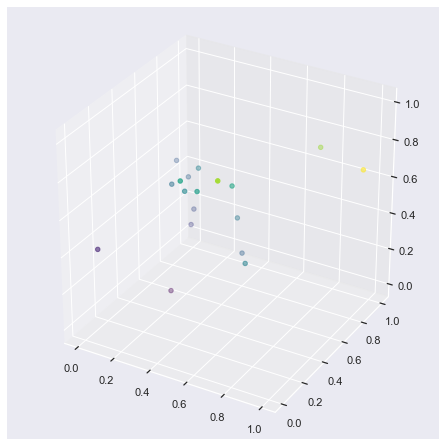

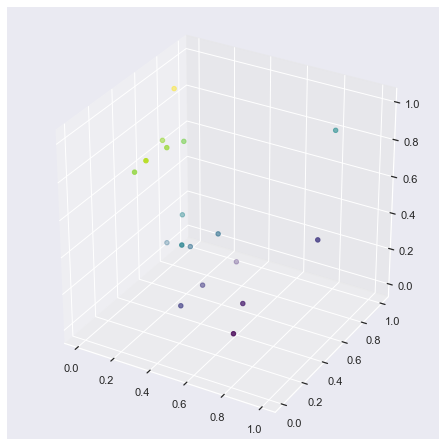

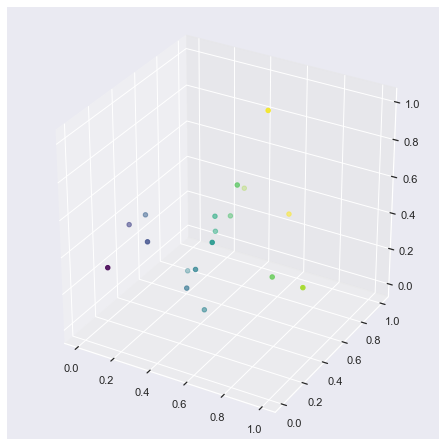

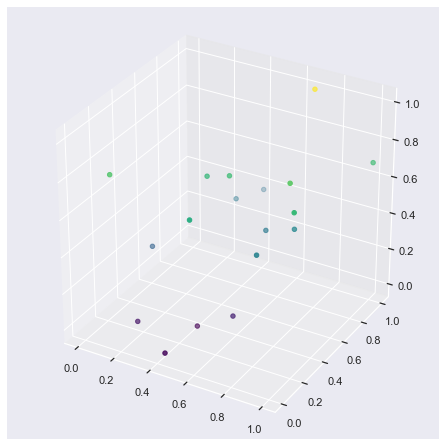

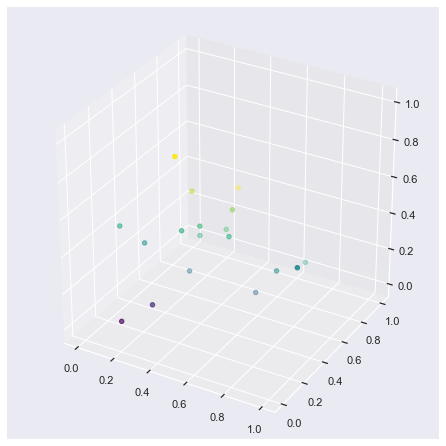

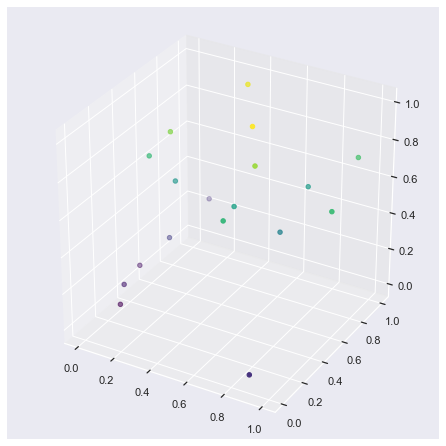

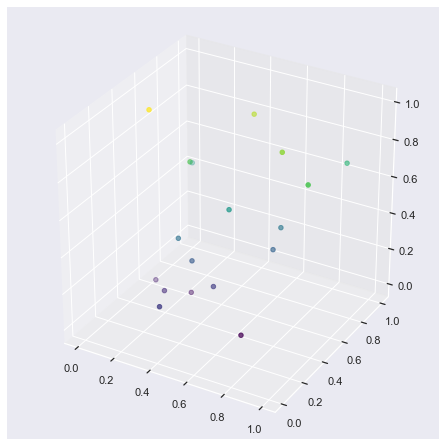

In [153]:
from mpl_toolkits.mplot3d import Axes3D

linearmodels = {}
linear_scalers = {}

for country in countriesToTest:
    #prep indiv. data
    countryyield = rawMeltedProduction.copy()[rawMeltedProduction['Area'] == country]
    countryyield['Year'] = countryyield['Year'].astype(str)
    countryclimate = climate_melted.copy()[climate_melted['Area'] == country]
    countryclimate['Year'] = countryclimate['Year'].astype(str)
    countryharvested = areaHarvestedMelted.copy()[areaHarvestedMelted['Area'] == country]
    countryharvested['Year'] = countryharvested['Year'].astype(str)
    #merge
    countrymerged = pd.merge(countryyield, countryclimate, on=["Year", "Area"], how='inner')
    countrymerged = countrymerged.merge(countryharvested, on=['Year', 'Area'], how='inner') 
    countrymerged[metric] = countrymerged[metric].astype(int)
    if('index' in countrymerged.columns):
        countrymerged.drop(columns=['index'], inplace=True)
    if(len(countrymerged != 0)):
        countrymerged['Year'] = countrymerged['Year'].astype(int)
        y = countrymerged[metric].values
        X = countrymerged.drop(['Year', 'Area', metric], axis=1).values
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)
        min_max_scaler = preprocessing.MinMaxScaler()
        X_train = min_max_scaler.fit_transform(X_train)

        reg_test = LinearRegression()
        reg_test.fit(X_train, y_train)
    
        feat1 = X_train.T[0]
        feat2 = X_train.T[1]
        feat3 = X_train.T[2]
        fig = plt.figure(figsize=(6,6))

        ax = Axes3D(fig)#         

        ax.scatter3D(feat1, feat2, feat3, c=reg_test.predict(X_train), cmap='viridis');

        X_test = min_max_scaler.transform(X_test)

        y_pred = reg_test.predict(X_test)
        print("R^2: {} for {}".format(reg_test.score(X_test, y_test), country))
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        print("Root Mean Squared Error: {} for {}".format(rmse, country), end='\n\n')
        linearmodels[country] = reg_test
        linear_scalers[country] = min_max_scaler

In [26]:
areaHarvestedMelted[areaHarvestedMelted['Area'] == 'Kazakhstan']

,Year,Area,Area harvested
115,1961,Kazakhstan,0.00000
372,1962,Kazakhstan,0.00000
629,1963,Kazakhstan,0.00000
886,1964,Kazakhstan,0.00000
1143,1965,Kazakhstan,0.00000
1400,1966,Kazakhstan,0.00000
1657,1967,Kazakhstan,0.00000
1914,1968,Kazakhstan,0.00000
2171,1969,Kazakhstan,0.00000
2428,1970,Kazakhstan,0.00000


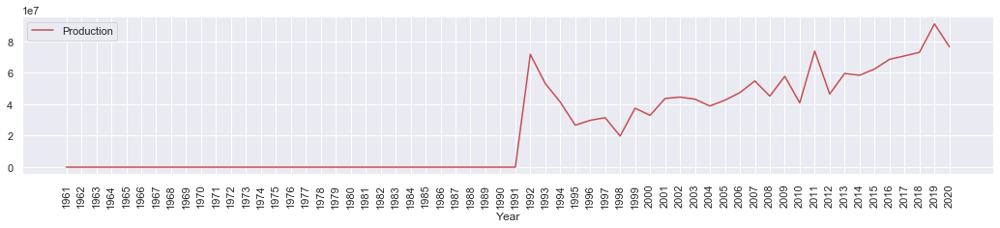

In [148]:
kazakh = linearmodels['Kazakhstan']
kazakhscaler = linear_scalers['Kazakhstan']
kazakh2020 = kazakh.predict(kazakhscaler.transform([[348.03990, 8.0000, 45061242.00000]]))[0]
withkazakh = rawMeltedProduction.copy()[rawMeltedProduction['Area'] == 'Kazakhstan'].append({'Year': '2020', 'Area':'Liberia', 'Production': kazakh2020}, ignore_index=True).set_index('Year')
withkazakh.plot(color='r')
plt.xticks(range(len(withkazakh.index)), withkazakh.index, rotation=90)
plt.show()

In [28]:
3778232.00000
liberia = linearmodels['Liberia']
liberiscaler = linear_scalers['Liberia']
lib2020 = liberia.predict(liberiscaler.transform([[2700.79150, 26.18398, 1300000.00000]]))[0]

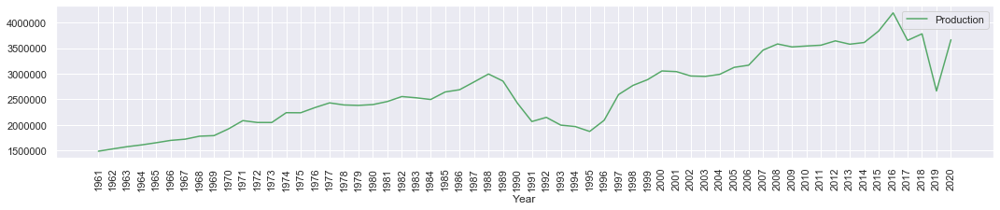

In [151]:
withlib = rawMeltedProduction.copy()[rawMeltedProduction['Area'] == 'Liberia'].append({'Year': '2020', 'Area':'Liberia', 'Production': lib2020}, ignore_index=True).set_index('Year')
ax = withlib.plot(color='g')
plt.xticks(range(len(withlib.index)), withlib.index, rotation=90)
plt.show()
# ax.set_xticklabels(withlib["Year"]);

### Polynomial Regression for Overall

In [30]:
polyregmodels = {}
polyfitters = {}
scalers = {}

for country in countriesToTest:
    countryyield = rawMeltedProduction.copy()[rawMeltedProduction['Area'] == country]
    countryclimate = climate_melted.copy()[climate_melted['Area'] == country]
    countryharvested = areaHarvestedMelted.copy()[areaHarvestedMelted['Area'] == country]
    countryyield['Year'] = countryyield['Year'].astype(str)
    countryclimate['Year'] = countryclimate['Year'].astype(str)
    countryharvested['Year'] = countryharvested['Year'].astype(str)
    countrymerged = pd.merge(countryyield, countryclimate, on=["Year", "Area"], how='inner')
    countrymerged = countrymerged.merge(countryharvested, on=['Year', 'Area'], how='inner')
    if('index' in countrymerged.columns):
        countrymerged.drop(columns=['index'], inplace=True)
    if(len(countrymerged != 0)):
        countrymerged['Year'] = countrymerged['Year'].astype(int)
        y = countrymerged[metric].values
        X = countrymerged.drop(['Year', 'Area', metric], axis=1).values
        poly = PolynomialFeatures(degree=2)
        X_ = poly.fit_transform(X)
        X_train, X_test, y_train, y_test = train_test_split(X_, y, test_size = 0.3, random_state=42)
        reg_test = LinearRegression()

        min_max_scaler = preprocessing.MinMaxScaler()
        X_train = min_max_scaler.fit_transform(X_train)

        reg_test.fit(X_train, y_train)
        X_test = min_max_scaler.transform(X_test)

        y_pred = reg_test.predict(X_test)

        print("R^2: {} for {}".format(reg_test.score(X_test, y_test), country))
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        print("Root Mean Squared Error: {} for {}".format(rmse, country))

        polyregmodels[country] = reg_test
        polyfitters[country] = poly
        scalers[country] = min_max_scaler

R^2: -21.783622572659706 for Kazakhstan
Root Mean Squared Error: 97512493.33797733 for Kazakhstan
R^2: 0.6076512490158633 for Republic of Korea
Root Mean Squared Error: 1605163.2887546238 for Republic of Korea
R^2: -3.9273885929914227 for Namibia
Root Mean Squared Error: 511892.0385789565 for Namibia
R^2: 0.8489251754222411 for Liberia
Root Mean Squared Error: 216061.66840368017 for Liberia
R^2: 0.10222380883217697 for Somalia
Root Mean Squared Error: 171367.25318665773 for Somalia
R^2: -0.25148698017354976 for Guinea-Bissau
Root Mean Squared Error: 242645.08254928244 for Guinea-Bissau
R^2: 0.8174549849481003 for India
Root Mean Squared Error: 115617516.36979388 for India


## Caffeine Crop Yields

### Linear Regression for Caffeine Crops

In [31]:
caffeineProdCountries = ['Angola', 'Argentina', 'Azerbaijan', 'Bangladesh', 'Belize',
       'Benin', 'Bolivia (Plurinational State of)', 'Brazil', 'Burundi',
       'Cabo Verde', 'Cambodia', 'Cameroon', 'Central African Republic',
       'China', 'China, mainland', 'China, Taiwan Province of',
       'Colombia', 'Comoros', 'Congo', 'Cook Islands', 'Costa Rica',
       "Côte d'Ivoire", 'Cuba', 'Democratic Republic of the Congo',
       'Dominica', 'Dominican Republic', 'Ecuador', 'El Salvador',
       'Equatorial Guinea', 'Ethiopia', 'Ethiopia PDR', 'Fiji',
       'French Polynesia', 'Gabon', 'Georgia', 'Ghana', 'Guadeloupe',
       'Guatemala', 'Guinea', 'Guyana', 'Haiti', 'Honduras', 'India',
       'Indonesia', 'Iran (Islamic Republic of)', 'Jamaica', 'Japan',
       'Kenya', "Lao People's Democratic Republic", 'Liberia',
       'Madagascar', 'Malawi', 'Malaysia', 'Mali', 'Martinique',
       'Mauritius', 'Mexico', 'Montenegro', 'Mozambique', 'Myanmar',
       'Nepal', 'New Caledonia', 'Nicaragua', 'Nigeria', 'Panama',
       'Papua New Guinea', 'Paraguay', 'Peru', 'Philippines', 'Portugal',
       'Puerto Rico', 'Republic of Korea', 'Réunion', 'Russia', 'Rwanda',
       'Saint Lucia', 'Saint Vincent and the Grenadines', 'Samoa',
       'Sao Tome and Principe', 'Saudi Arabia', 'Seychelles',
       'Sierra Leone', 'South Africa', 'Sri Lanka', 'Suriname',
       'Thailand', 'Timor-Leste', 'Togo', 'Tonga', 'Trinidad and Tobago',
       'Turkey', 'Uganda', 'United Republic of Tanzania', 'United States',
       'USSR', 'Vanuatu', 'Venezuela (Bolivarian Republic of)',
       'Viet Nam', 'Yemen', 'Zambia', 'Zimbabwe', 'World', 'Africa',
       'Eastern Africa', 'Middle Africa', 'Southern Africa',
       'Western Africa', 'Americas', 'Northern America',
       'Central America', 'Caribbean', 'South America']

In [32]:
coffee = crops_clean[np.logical_and(crops_clean['Element'] == 'Production', crops_clean['Item'].str.contains('Coffee'))].melt(id_vars=['Area'], value_vars=crops_clean.columns[3:],
                              var_name='Year', value_name='Production')
coffee = coffee.groupby(['Year', 'Area'])['Production'].mean().reset_index()
coffee

,Year,Area,Production
0,1961,Africa,870970.00000
1,1961,Americas,3450946.00000
2,1961,Angola,168600.00000
3,1961,Asia,200714.00000
4,1961,Belize,0.00000
...,...,...,...
6491,2018,Western Asia,19338.00000
6492,2018,World,10303118.00000
6493,2018,Yemen,19338.00000
6494,2018,Zambia,7104.00000


In [33]:
cafflinearmodels = {}
cafflinear_scalers = {}

for country in caffeineProdCountries:
    #prep indiv. data
    countryyield = coffee.copy()[coffee['Area'] == country]
    countryclimate = climate_melted.copy()[climate_melted['Area'] == country]
    countryharvested = coffHarvestedMelted.copy()[coffHarvestedMelted['Area'] == country]
    countryharvested['Year'] = countryharvested['Year'].astype(str)
    #merge
    countrymerged = pd.merge(countryyield, countryclimate, on=["Year", "Area"], how='inner')
    countrymerged = countrymerged.merge(countryharvested, on=['Year', 'Area'], how='inner')    
    if('index' in countrymerged.columns):
        countrymerged.drop(columns=['index'], inplace=True)
    if(len(countrymerged != 0)):
        countrymerged['Year'] = countrymerged['Year'].astype(int)
        y = countrymerged[metric].values
        X = countrymerged.drop(['Year', 'Area', metric], axis=1).values
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)
        min_max_scaler = preprocessing.MinMaxScaler()
        X_train = min_max_scaler.fit_transform(X_train)

        reg_test = LinearRegression()
        reg_test.fit(X_train, y_train)

        X_test = min_max_scaler.transform(X_test)

        y_pred = reg_test.predict(X_test)
        print("R^2: {} for {}".format(reg_test.score(X_test, y_test), country))
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        print("Root Mean Squared Error: {} for {}".format(rmse, country))
        cafflinearmodels[country] = reg_test
        cafflinear_scalers[country] = min_max_scaler

R^2: -0.16094348933036096 for Angola
Root Mean Squared Error: 4854.479206122073 for Angola
R^2: 0.6443856059570876 for Belize
Root Mean Squared Error: 52.229846946238794 for Belize
R^2: 0.9387083989405185 for Benin
Root Mean Squared Error: 12.802061691453728 for Benin
R^2: 0.4904342234432669 for Bolivia (Plurinational State of)
Root Mean Squared Error: 3588.434360210594 for Bolivia (Plurinational State of)
R^2: 0.8390203247152461 for Brazil
Root Mean Squared Error: 197101.80667889147 for Brazil
R^2: 0.993839228020107 for Burundi
Root Mean Squared Error: 5450.015715726281 for Burundi
R^2: 0.695189423215195 for Cabo Verde
Root Mean Squared Error: 9.408954346522085 for Cabo Verde
R^2: 0.9912958177644715 for Cambodia
Root Mean Squared Error: 6.056252959948933 for Cambodia
R^2: 0.837397278997146 for Cameroon
Root Mean Squared Error: 10954.397874465252 for Cameroon
R^2: 0.05178005096123306 for Central African Republic
Root Mean Squared Error: 4475.239622507604 for Central African Republic
R^

In [46]:
coffHarvestedMelted[coffHarvestedMelted['Area'] == 'Viet Nam']

,Year,Area,Area harvested
105,1961,Viet Nam,21200.00000
217,1962,Viet Nam,24410.00000
329,1963,Viet Nam,25000.00000
441,1964,Viet Nam,25000.00000
553,1965,Viet Nam,22800.00000
665,1966,Viet Nam,22200.00000
777,1967,Viet Nam,23000.00000
889,1968,Viet Nam,18000.00000
1001,1969,Viet Nam,17000.00000
1113,1970,Viet Nam,18600.00000


In [47]:
#1616307.00000
vietscaler = cafflinear_scalers['Viet Nam']
vietnam = cafflinearmodels['Viet Nam']
#rainfall, temperature, area harvested
viet2020 = vietnam.predict(vietscaler.transform([[2000, 25.07316, 620000.00000]]))[0]
print(viet2020)

1318176.1975596398


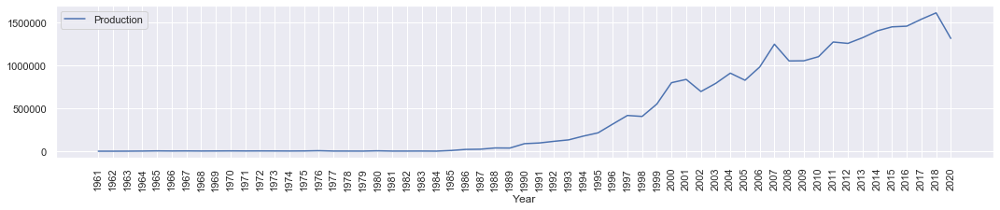

In [49]:
withviet = coffee.copy()[coffee['Area'] == 'Viet Nam'].append({'Year': '2020', 'Area':'Viet Nam', 'Production': viet2020}, ignore_index=True).set_index('Year')
ax = withviet.plot()
plt.xticks(range(len(withviet.index)), withviet.index, rotation=90)
plt.show()

In [37]:
caffpolyregmodels = {}
caffpolyfitters = {}
caffscalers = {}

for country in caffeineProdCountries:
    countryyield = caffeineMelted.copy()[caffeineMelted['Area'] == country]
    countryclimate = climate_melted.copy()[climate_melted['Area'] == country]
    countryharvested = areaHarvestedMelted.copy()[areaHarvestedMelted['Area'] == country]
    countryharvested['Year'] = countryharvested['Year'].astype(str)
    countrymerged = pd.merge(countryyield, countryclimate, on=["Year", "Area"], how='inner')
    countrymerged = countrymerged.merge(countryharvested, on=['Year', 'Area'], how='inner')
    if('index' in countrymerged.columns):
        countrymerged.drop(columns=['index'], inplace=True)
    
    if(len(countrymerged != 0)):
        countrymerged['Year'] = countrymerged['Year'].astype(int)
        y = countrymerged[metric].values
        X = countrymerged.drop(['Year', 'Area', metric], axis=1).values
        poly = PolynomialFeatures(degree=2)
        X_ = poly.fit_transform(X)
        X_train, X_test, y_train, y_test = train_test_split(X_, y, test_size = 0.3, random_state=42)
        reg_test = LinearRegression()

        min_max_scaler = preprocessing.MinMaxScaler()
        X_train = min_max_scaler.fit_transform(X_train)

        reg_test.fit(X_train, y_train)
        X_test = min_max_scaler.transform(X_test)

        y_pred = reg_test.predict(X_test)

        print("R^2: {} for {}".format(reg_test.score(X_test, y_test), country))
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        print("Root Mean Squared Error: {} for {}".format(rmse, country))

        polyregmodels[country] = reg_test
        polyfitters[country] = poly
        scalers[country] = min_max_scaler

R^2: 0.1738681083313981 for Angola
Root Mean Squared Error: 4095.074422632858 for Angola
R^2: 0.5201113984790968 for Argentina
Root Mean Squared Error: 9030.501511627956 for Argentina
R^2: -1101.2573549822464 for Azerbaijan
Root Mean Squared Error: 237939.10506110502 for Azerbaijan
R^2: 0.06799793364325701 for Bangladesh
Root Mean Squared Error: 6946.732834831214 for Bangladesh
R^2: 0.24791892771432866 for Belize
Root Mean Squared Error: 75.95588301356693 for Belize
R^2: -1.1885246735061692 for Benin
Root Mean Squared Error: 29.98212735477843 for Benin
R^2: 0.8305748882699001 for Bolivia (Plurinational State of)
Root Mean Squared Error: 1056.540797736633 for Bolivia (Plurinational State of)
R^2: 0.3424884969600698 for Brazil
Root Mean Squared Error: 198548.43599745914 for Brazil
R^2: -0.07074877642483779 for Burundi
Root Mean Squared Error: 39405.05462389687 for Burundi
R^2: -1.5254816411356433 for Cabo Verde
Root Mean Squared Error: 27.083104957654566 for Cabo Verde
R^2: 0.54446078279

R^2: -0.35929847575453633 for Zambia
Root Mean Squared Error: 1103.648438361521 for Zambia
R^2: -0.7523112517477675 for Zimbabwe
Root Mean Squared Error: 3250.4067466716174 for Zimbabwe


## Testing Predictions

91027543.51716447


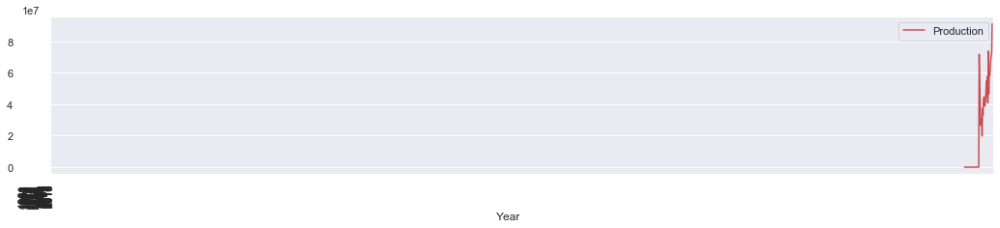

In [38]:
kazakh = linearmodels['Kazakhstan']
#Kazakhstan's total rainfall, average temperature and area harvested
X = [[320, 30, 11413941]]
pred2019 = kazakh.predict(linear_scalers['Kazakhstan'].transform(X))
print(pred2019[0])
rawMeltedProduction = rawMeltedProduction.append({'Year': 2019, 'Area': 'Kazakhstan', 'Production': pred2019[0]}, ignore_index=True)
kazakh = rawMeltedProduction[rawMeltedProduction['Area'] == 'Kazakhstan']
kazakh = kazakh.set_index('Year')
kazakh.plot(color='r')
plt.xticks(range(len(kazakh.index)), kazakh.index, rotation=90)
plt.show()

2663076.9708257522


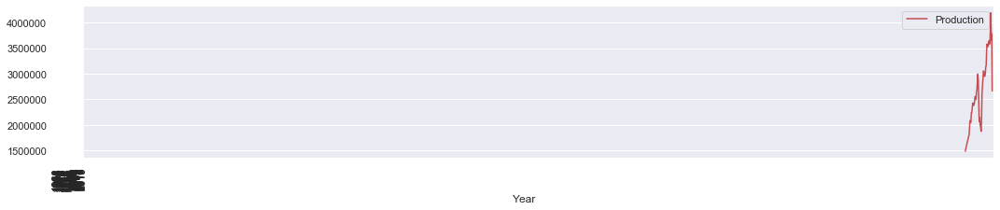

In [39]:
korea = linearmodels['Liberia']
#Kazakhstan's total rainfall, average temperature and area harvested
X = [[3000.79150, 30.17398, 1279954]]
pred2019 = korea.predict(linear_scalers['Liberia'].transform(X))
print(pred2019[0])
rawMeltedProduction = rawMeltedProduction.append({'Year': 2019, 'Area': 'Liberia', 'Production': pred2019[0]}, ignore_index=True)
koreaY = rawMeltedProduction[rawMeltedProduction['Area'] == 'Liberia']
koreaY = koreaY.set_index('Year')
koreaY.plot(color='r')
plt.xticks(range(len(koreaY.index)), koreaY.index, rotation=90)
plt.show()